## Step 16: Evaluate mouse scRNA-seq reanalysis rebuttal

After we voiced our concerns that the cluster labeled as epigenetic memory astrocytes by Lee et al in their reanalysis of the Wheeler et al dataset were mis-annotated macrophages, and that the Wheeler dataset seems to include a large number of mislabeled non-astrocyte cell types, the authors of Lee et al responded with a rebuttal. This script will evaluate points made by the authors' rebuttal.

In [1]:
library(Seurat)
library(readxl)
library(ggplot2)
library(ggpubr)
library(ggsci)
library(dplyr)
library(Nebulosa)
library(viridis)
library(presto)
library(ggrepel)
library(ggrastr)
library(cowplot)
library(gridExtra)
library(ComplexHeatmap)
library(grid)
library(svglite)
library(IRdisplay)

setwd('..') # changing working directory to 'EpiMemAstros' folder

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: patchwork

Loading required package: viridisLite

Loading required package: Rcpp

Loading required package: data.table


Attaching package: ‘data.table’


The following objects are masked from ‘package:dplyr’:

    between, first, last



Attaching package: ‘cowplot’


The following object is masked from ‘package:patchwork’:

    align_plots


The following object is masked from ‘package:ggpubr’:

    get_legend



Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine


Loading required package: grid

ComplexHeatmap version 2.18.0
Bioconduct

First, we will load our reanalyzed Seurat object produced in the Step 10 notebook. (We've also included this object in the Zenodo repository for your convenience. Replace the following line with the commented line if you'd like to load the pre-made object from Zenodo instead.)

In [2]:
wheeler <- readRDS('outputs/wheeler_final_seurat_object.rds')
#wheeler <- readRDS('inputs/zenodo/wheeler_final_seurat_object.rds')
wheeler

An object of class Seurat 
30317 features across 24963 samples within 1 assay 
Active assay: RNA (30317 features, 2000 variable features)
 3 layers present: data, counts, scale.data
 4 dimensional reductions calculated: pca, umap, tsne, harmony

Next, load the Seurat object provided to us by the authors of Lee et al for their rebuttal:

In [3]:
wheeler_rebuttal = readRDS('inputs/zenodo/rebuttal/TDTOMATO_Astrocytes_final.rds')
wheeler_rebuttal

An object of class Seurat 
32317 features across 15973 samples within 2 assays 
Active assay: RNA (30317 features, 2000 variable features)
 3 layers present: scale.data, data, counts
 1 other assay present: integrated
 3 dimensional reductions calculated: pca, tsne, umap

We note this Seurat object provided by the authors contains 3 metadata slots, `memory.signature.up1`, `memory.signature.down2`, and `memory_signature_score` which seem to correspond to enrichment scores for the up- and down- signature gene sets. We'll evaluate these in a moment.

In [4]:
head(wheeler_rebuttal$memory.signature.up1)
head(wheeler_rebuttal$memory.signature.down2)
head(wheeler_rebuttal$memory_signature_score)

GSM3721791_TGTATCTACTGA GSM3721791_CGAGCCCCCGGC GSM3721791_AATAGTCTTGTN 
           -0.003209468            -0.011236445            -0.001059632 
GSM3721791_GCGGACCAGCAN GSM3721791_TACTAATTCAAC GSM3721791_TCCTTCCAGGGT 
           -0.005251791            -0.004590295            -0.008413186

GSM3721791_TGTATCTACTGA GSM3721791_CGAGCCCCCGGC GSM3721791_AATAGTCTTGTN 
            -0.01082269              0.23829932             -0.05863401 
GSM3721791_GCGGACCAGCAN GSM3721791_TACTAATTCAAC GSM3721791_TCCTTCCAGGGT 
             0.17757152              0.10068128              0.17430491

GSM3721791_TGTATCTACTGA GSM3721791_CGAGCCCCCGGC GSM3721791_AATAGTCTTGTN 
            0.007613218            -0.249535768             0.057574379 
GSM3721791_GCGGACCAGCAN GSM3721791_TACTAATTCAAC GSM3721791_TCCTTCCAGGGT 
           -0.182823314            -0.105271580            -0.182718092

The authors' initial response to our concerns that this dataset contains many non-astrocyte cell types was to state that [Extended Data Figure 3E](https://www.nature.com/articles/s41586-020-1999-0/figures/9) from the Wheeler et al paper validated that astrocyte marker genes were expressed throughout the cells in the dataset. Let's start by reproducing that figure panel. 

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


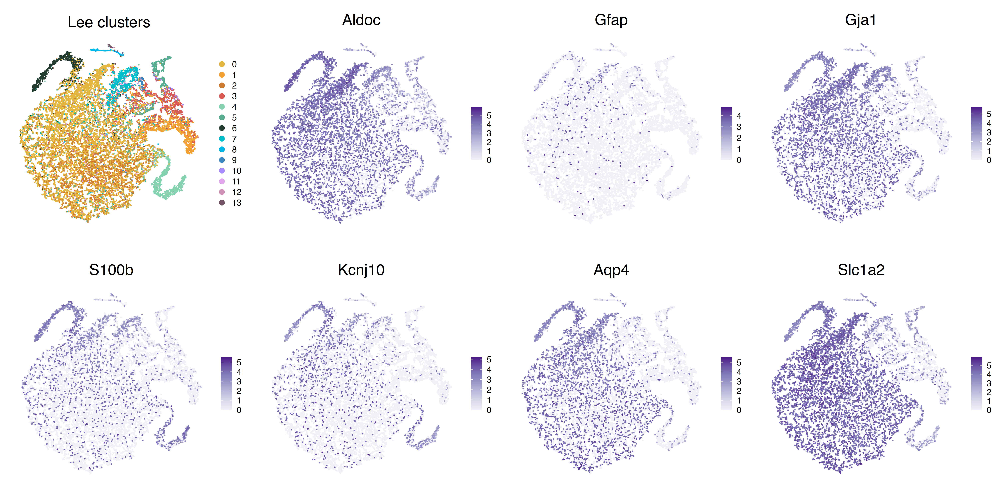

In [5]:
options(repr.plot.width=20, repr.plot.height=10, repr.plot.res = 300)

image = DimPlot(wheeler, reduction = "tsne") + 
    scale_color_manual(values = c("#e2b63f", "#f1a031", "#d07c31", "#d95954", "#84d2b0",
                                 "#58ae90", "#233d31", "#00bfca", "#00b8e9", "#3b86bd", 
                                  "#a68afe", "#e2a6ef", "#ce92b7", "#745568"
                                 )) + 
        theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(hjust = 0.5, size = 22, face = "bold")) + labs(title = 'Lee clusters')
    
p1 = FeaturePlot(wheeler, feature = "Aldoc", order = TRUE, pt.size = 0.1, reduction = 'tsne') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p2 = FeaturePlot(wheeler, feature = "Gfap", order = TRUE, pt.size = 0.1, reduction = 'tsne') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p3 = FeaturePlot(wheeler, feature = "Gja1", order = TRUE, pt.size = 0.1, reduction = 'tsne') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p4 = FeaturePlot(wheeler, feature = "S100b", order = TRUE, pt.size = 0.1, reduction = 'tsne') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p5 = FeaturePlot(wheeler, feature = "Kcnj10", order = TRUE, pt.size = 0.1, reduction = 'tsne') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p6 = FeaturePlot(wheeler, feature = "Aqp4", order = TRUE, pt.size = 0.1, reduction = 'tsne') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p7 = FeaturePlot(wheeler, feature = "Slc1a2", order = TRUE, pt.size = 0.1, reduction = 'tsne') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))


plot = plot_grid(image, p1, p2, p3, p4, p5, p6, p7, nrow = 2, ncol = 4, align = 'h')

ggsave(file="outputs/figures/wheeler_rebuttal_astrocyte_marker_genes_on_tsne.png", plot=plot, width=20, height=10)

plot

We can see that some astrocyte marker genes (like *Aldoc*) are expressed pretty broadly, but others are expressed rather sparsely throughout the dataset. This alone is not evidence that the Wheeler dataset is highly pure. Let's have a look at some non-astrocyte cell type marker genes viewed in the same format.

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


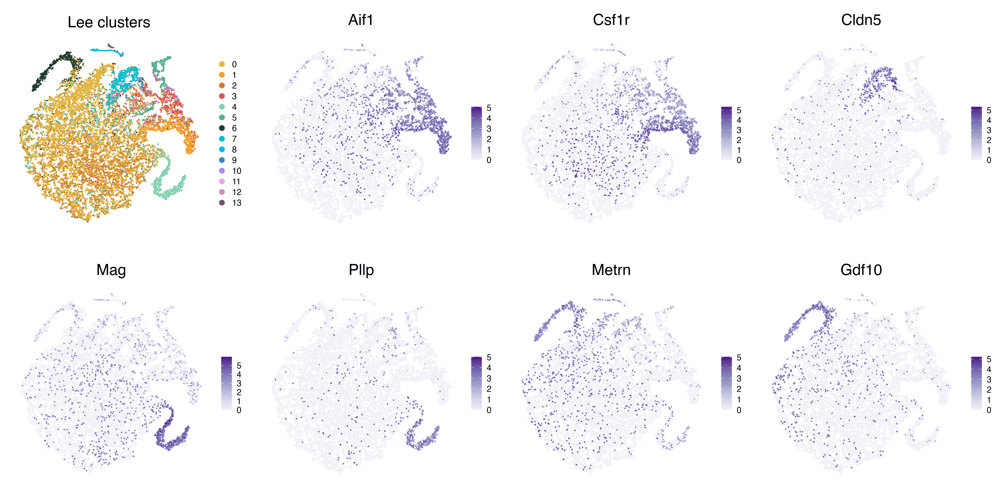

In [6]:
options(repr.plot.width=20, repr.plot.height=10, repr.plot.res = 300)

image = DimPlot(wheeler, reduction = "tsne") + 
    scale_color_manual(values = c("#e2b63f", "#f1a031", "#d07c31", "#d95954", "#84d2b0",
                                 "#58ae90", "#233d31", "#00bfca", "#00b8e9", "#3b86bd", 
                                  "#a68afe", "#e2a6ef", "#ce92b7", "#745568"
                                 )) + 
        theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(hjust = 0.5, size = 22, face = "bold")) + labs(title = 'Lee clusters')
    
p1 = FeaturePlot(wheeler, feature = "Aif1", order = TRUE, pt.size = 0.1, reduction = 'tsne') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p2 = FeaturePlot(wheeler, feature = "Csf1r", order = TRUE, pt.size = 0.1, reduction = 'tsne') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p3 = FeaturePlot(wheeler, feature = "Cldn5", order = TRUE, pt.size = 0.1, reduction = 'tsne') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p4 = FeaturePlot(wheeler, feature = "Mag", order = TRUE, pt.size = 0.1, reduction = 'tsne') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p5 = FeaturePlot(wheeler, feature = "Pllp", order = TRUE, pt.size = 0.1, reduction = 'tsne') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p6 = FeaturePlot(wheeler, feature = "Metrn", order = TRUE, pt.size = 0.1, reduction = 'tsne') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p7 = FeaturePlot(wheeler, feature = "Gdf10", order = TRUE, pt.size = 0.1, reduction = 'tsne') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))


plot = plot_grid(image, p1, p2, p3, p4, p5, p6, p7, nrow = 2, ncol = 4, align = 'h')

ggsave(file="outputs/figures/wheeler_rebuttal_nonastrocyte_marker_genes_on_tsne.png", plot=plot, width=20, height=10)

plot

When examining non-astrocyte marker genes, we see that several populations were likely mis-annotated. Here we see that macrophage/microglia markers *Aif1* and *Csf1r* label a large number of cells, endothelial cell marker *Cldn5* labels many other cells, one cluster is decidedly enriched in oligodendrocyte markers *Mag* and *Pllp*, and another cluster expresses Bergmann glia markers *Metrn* and *Gdf10*. We can view these same populations in the UMAP embedding shown in the Lee et al paper:

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


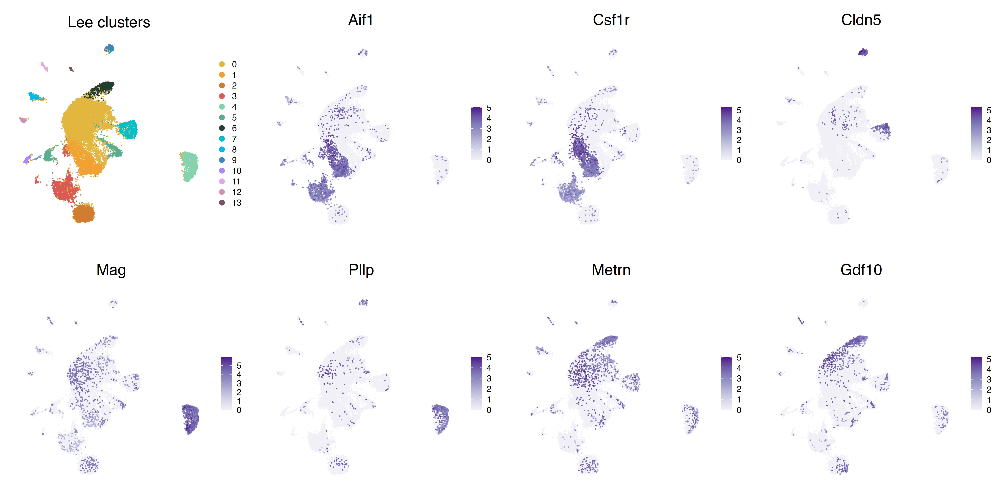

In [7]:
options(repr.plot.width=20, repr.plot.height=10, repr.plot.res = 300)

image = DimPlot(wheeler, reduction = "umap") + 
    scale_color_manual(values = c("#e2b63f", "#f1a031", "#d07c31", "#d95954", "#84d2b0",
                                 "#58ae90", "#233d31", "#00bfca", "#00b8e9", "#3b86bd", 
                                  "#a68afe", "#e2a6ef", "#ce92b7", "#745568"
                                 )) + 
        theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(hjust = 0.5, size = 22, face = "bold")) + labs(title = 'Lee clusters')
    
p1 = FeaturePlot(wheeler, feature = "Aif1", order = TRUE, pt.size = 0.1, reduction = 'umap') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p2 = FeaturePlot(wheeler, feature = "Csf1r", order = TRUE, pt.size = 0.1, reduction = 'umap') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p3 = FeaturePlot(wheeler, feature = "Cldn5", order = TRUE, pt.size = 0.1, reduction = 'umap') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p4 = FeaturePlot(wheeler, feature = "Mag", order = TRUE, pt.size = 0.1, reduction = 'umap') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p5 = FeaturePlot(wheeler, feature = "Pllp", order = TRUE, pt.size = 0.1, reduction = 'umap') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p6 = FeaturePlot(wheeler, feature = "Metrn", order = TRUE, pt.size = 0.1, reduction = 'umap') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p7 = FeaturePlot(wheeler, feature = "Gdf10", order = TRUE, pt.size = 0.1, reduction = 'umap') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))


plot = plot_grid(image, p1, p2, p3, p4, p5, p6, p7, nrow = 2, ncol = 4, align = 'h')

ggsave(file="outputs/figures/wheeler_rebuttal_nonastrocyte_marker_genes_on_umap.png", plot=plot, width=20, height=10)

plot

Other populations of note include immature neurons (*Dlx1*, *Gad2*), pericytes (*Vtn*, *Rgcc*), choroid plexus (*Clic6*, *Folr1*), T cells (*Cd2*, *Cd3g*), smooth muscle (*Acta2*, *Myl9*), fibroblasts (*Col1a2*, *Dcn*), and ependymal cells (*Rarres2*, *Ak7*):

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


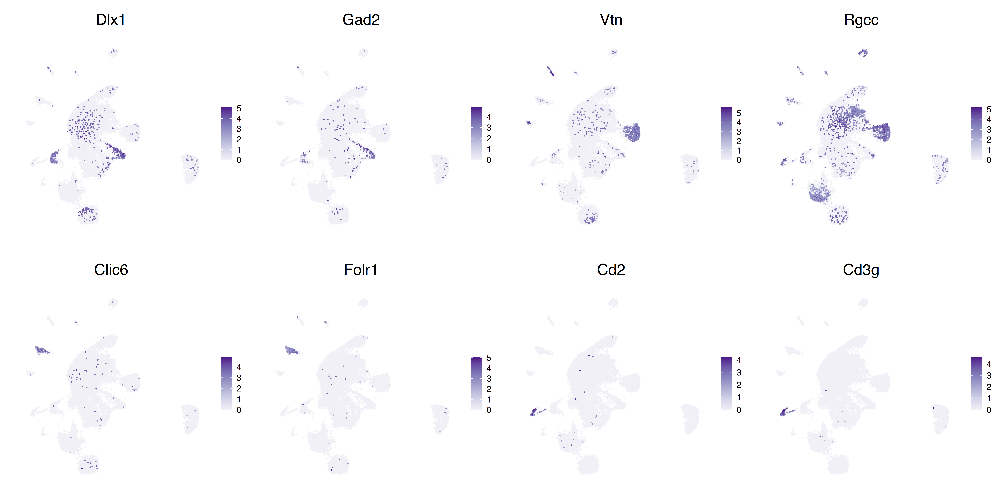

In [8]:
options(repr.plot.width=20, repr.plot.height=10, repr.plot.res = 300)

image = FeaturePlot(wheeler, feature = "Dlx1", order = TRUE, pt.size = 0.1, reduction = 'umap') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
    
p1 = FeaturePlot(wheeler, feature = "Gad2", order = TRUE, pt.size = 0.1, reduction = 'umap') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p2 = FeaturePlot(wheeler, feature = "Vtn", order = TRUE, pt.size = 0.1, reduction = 'umap') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p3 = FeaturePlot(wheeler, feature = "Rgcc", order = TRUE, pt.size = 0.1, reduction = 'umap') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p4 = FeaturePlot(wheeler, feature = "Clic6", order = TRUE, pt.size = 0.1, reduction = 'umap') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p5 = FeaturePlot(wheeler, feature = "Folr1", order = TRUE, pt.size = 0.1, reduction = 'umap') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p6 = FeaturePlot(wheeler, feature = "Cd2", order = TRUE, pt.size = 0.1, reduction = 'umap') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p7 = FeaturePlot(wheeler, feature = "Cd3g", order = TRUE, pt.size = 0.1, reduction = 'umap') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))


plot = plot_grid(image, p1, p2, p3, p4, p5, p6, p7, nrow = 2, ncol = 4, align = 'h')

ggsave(file="outputs/figures/wheeler_rebuttal_nonastrocyte_marker_genes_on_umap2.png", plot=plot, width=20, height=10)

plot

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


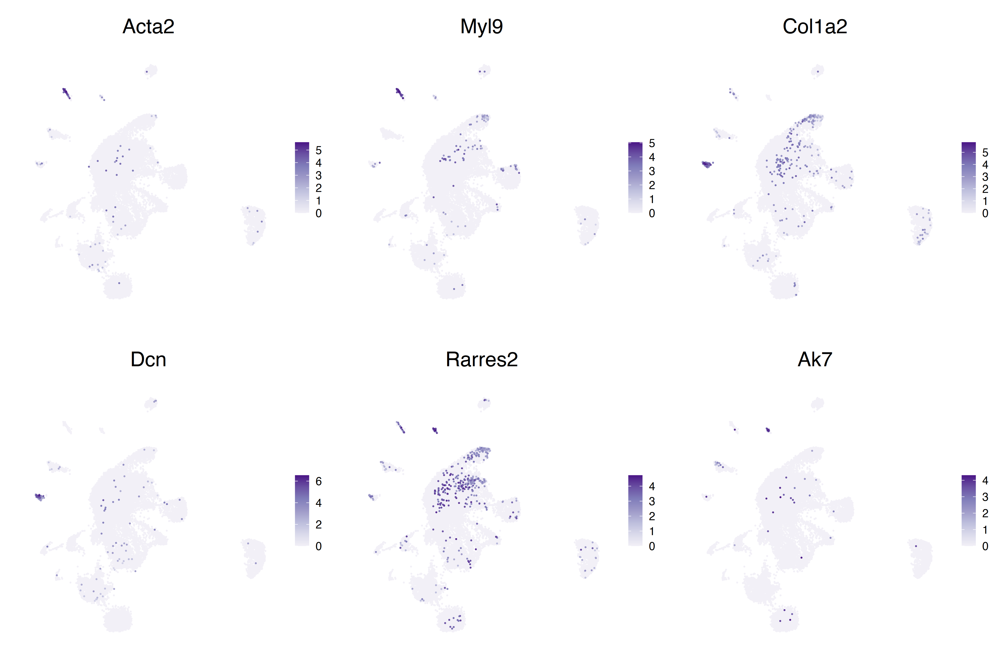

In [9]:
options(repr.plot.width=15, repr.plot.height=10, repr.plot.res = 300)

p1 = FeaturePlot(wheeler, feature = "Acta2", order = TRUE, pt.size = 0.1, reduction = 'umap') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
    
p2 = FeaturePlot(wheeler, feature = "Myl9", order = TRUE, pt.size = 0.1, reduction = 'umap') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p3 = FeaturePlot(wheeler, feature = "Col1a2", order = TRUE, pt.size = 0.1, reduction = 'umap') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p4 = FeaturePlot(wheeler, feature = "Dcn", order = TRUE, pt.size = 0.1, reduction = 'umap') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p5 = FeaturePlot(wheeler, feature = "Rarres2", order = TRUE, pt.size = 0.1, reduction = 'umap') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))
p6 = FeaturePlot(wheeler, feature = "Ak7", order = TRUE, pt.size = 0.1, reduction = 'umap') +
    scale_color_distiller(palette = "Purples", direction = 1) +
    theme(aspect.ratio = 1, axis.text = element_blank(), axis.line = element_blank(), 
          axis.ticks = element_blank(), axis.title = element_blank(),
            plot.title=element_text(size = 22, face = "bold.italic"))


plot = plot_grid(p1, p2, p3, p4, p5, p6, nrow = 2, ncol = 3, align = 'h')

ggsave(file="outputs/figures/wheeler_rebuttal_nonastrocyte_marker_genes_on_umap3.png", plot=plot, width=15, height=10)

plot

We can see that it is not sufficient to simply examine expression of select astrocyte marker genes on t-SNE or UMAP embeddings to demonstrate astrocyte identity. Expression of non-astrocyte marker genes need to also be examined, as the process of sorting for a population of interest may result in detectable levels of target cell marker gene expression in off-target cell types due to ambient RNA contamination. Additionally, depiction of gene expression overlaid on low-dimension embeddings like t-SNE or UMAP can be easily misinterpreted due to over-plotting, making it difficult to perceive whether most cells in a cluster actually express the gene shown. For less biased cell type annotation, differential expression testing can be used to identify robust markers which distinguish different clusters. All these marker genes we show in the above plots are significant positive markers for at least one cluster.  

Given the above, we believe the claim that the Wheeler Extended Data Figure 3E panel validated the cells in this dataset were astrocytes is poorly founded.

Despite their claim that the Wheeler dataset was comprised of astrocytes with minimal contamination, the authors then proceeded to reanalyze the Wheeler dataset following preprocessing and filtering criteria used in a previous paper from our lab [(Hasel et al 2021, PMID: 34413515)](https://pubmed.ncbi.nlm.nih.gov/34413515/). With this approach, they identify a new cluster, Cluster 9, with increased enrichment of the corrected memory astrocyte signature and FIND-seq derived gene signature, which they describe as expanded in peak EAE. Let's examine these claims with the Seurat object they provided.

Firstly and most importantly, does this new cluster contain the same cells the authors previously identified as epigenetic memory astrocytes? We'll check the overlap between these two clusters to evaluate this.

First, let's check the format of the barcodes in our analyzed Seurat object and the rebuttal Seurat object: 

In [10]:
print("First few barcodes in our analyzed object:")
print(head(colnames(wheeler)))
print("First few barcodes in the authors' rebuttal object:")
print(head(colnames(wheeler_rebuttal)))

[1] "First few barcodes in our analyzed object:"
[1] "ATAAGTTCACAG_1" "CATGAGCCGCTA_1" "TGGATAATTAAA_1" "TTAACCCTGATA_1"
[5] "CATCACTGGGGT_1" "TACATACGTGCG_1"
[1] "First few barcodes in the authors' rebuttal object:"
[1] "GSM3721791_TGTATCTACTGA" "GSM3721791_CGAGCCCCCGGC"
[3] "GSM3721791_AATAGTCTTGTN" "GSM3721791_GCGGACCAGCAN"
[5] "GSM3721791_TACTAATTCAAC" "GSM3721791_TCCTTCCAGGGT"


We can see the barcodes are formatted differently. We'll convert the barcodes in our object into the format in the rebuttal object using a key file we created from the [Wheeler data's GEO page (GSE129763)](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE129763) (provided to you in the Zenodo repository).

In [11]:
wheeler_key = read.csv('inputs/zenodo/wheeler_geo_key.csv')
wheeler_key

processed_filename,sample_accession,sample_id
<chr>,<chr>,<chr>
GSM3721791_1_HCYTGDMXX.1.CGTACTAG.dge.txt.gz,GSM3721791,1_HCYTGDMXX.1.CGTACTAG.dge.txt.gz
GSM3721792_1_HCYTGDMXX.1.AGGCAGAA.dge.txt.gz,GSM3721792,1_HCYTGDMXX.1.AGGCAGAA.dge.txt.gz
GSM3721793_1_HCYTGDMXX.1.TCCTGAGC.dge.txt.gz,GSM3721793,1_HCYTGDMXX.1.TCCTGAGC.dge.txt.gz
GSM3721794_1_HCYTGDMXX.1.GGACTCCT.dge.txt.gz,GSM3721794,1_HCYTGDMXX.1.GGACTCCT.dge.txt.gz
GSM3721795_1_HCYTGDMXX.1.TAGGCATG.dge.txt.gz,GSM3721795,1_HCYTGDMXX.1.TAGGCATG.dge.txt.gz
GSM3721796_1_HCYTGDMXX.1.CTCTCTAC.dge.txt.gz,GSM3721796,1_HCYTGDMXX.1.CTCTCTAC.dge.txt.gz
GSM3721797_1_HCYTGDMXX.1.CAGAGAGG.dge.txt.gz,GSM3721797,1_HCYTGDMXX.1.CAGAGAGG.dge.txt.gz
GSM4002805_1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,GSM4002805,1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz
GSM4002806_1_H7NF2DRXX.1.CGGAGCCT.dge.txt.gz,GSM4002806,1_H7NF2DRXX.1.CGGAGCCT.dge.txt.gz


In [12]:
barcode_df = data.frame('samplebarcode' = gsub('(.*)_\\w+', '\\1', colnames(wheeler)), 'sampleid' = wheeler$samples)
head(barcode_df)

,samplebarcode,sampleid
,<chr>,<chr>
ATAAGTTCACAG_1,ATAAGTTCACAG,1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz
CATGAGCCGCTA_1,CATGAGCCGCTA,1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz
TGGATAATTAAA_1,TGGATAATTAAA,1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz
TTAACCCTGATA_1,TTAACCCTGATA,1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz
CATCACTGGGGT_1,CATCACTGGGGT,1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz
TACATACGTGCG_1,TACATACGTGCG,1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz


In [13]:
barcode_df = merge(barcode_df, wheeler_key, all.x = TRUE, by.x = 'sampleid', by.y = 'sample_id')
head(barcode_df)

,sampleid,samplebarcode,processed_filename,sample_accession
,<chr>,<chr>,<chr>,<chr>
1,1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,ATAAGTTCACAG,GSM4002805_1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,GSM4002805
2,1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,CATGAGCCGCTA,GSM4002805_1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,GSM4002805
3,1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,TGGATAATTAAA,GSM4002805_1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,GSM4002805
4,1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,TTAACCCTGATA,GSM4002805_1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,GSM4002805
5,1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,CATCACTGGGGT,GSM4002805_1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,GSM4002805
6,1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,TACATACGTGCG,GSM4002805_1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,GSM4002805


In [14]:
barcode_df$new_barcode <- paste(barcode_df$sample_accession, barcode_df$samplebarcode, sep = '_')
head(barcode_df)

,sampleid,samplebarcode,processed_filename,sample_accession,new_barcode
,<chr>,<chr>,<chr>,<chr>,<chr>
1,1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,ATAAGTTCACAG,GSM4002805_1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,GSM4002805,GSM4002805_ATAAGTTCACAG
2,1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,CATGAGCCGCTA,GSM4002805_1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,GSM4002805,GSM4002805_CATGAGCCGCTA
3,1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,TGGATAATTAAA,GSM4002805_1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,GSM4002805,GSM4002805_TGGATAATTAAA
4,1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,TTAACCCTGATA,GSM4002805_1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,GSM4002805,GSM4002805_TTAACCCTGATA
5,1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,CATCACTGGGGT,GSM4002805_1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,GSM4002805,GSM4002805_CATCACTGGGGT
6,1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,TACATACGTGCG,GSM4002805_1_H7NF2DRXX.1.ATGCGCAG.dge.txt.gz,GSM4002805,GSM4002805_TACATACGTGCG


In [15]:
wheeler$rebuttal_barcode <- barcode_df$new_barcode

In [16]:
print(paste0(length(intersect(colnames(wheeler_rebuttal), wheeler$rebuttal_barcode)), ' out of ', length(colnames(wheeler_rebuttal)), ' barcodes successfully converted...'))

[1] "15973 out of 15973 barcodes successfully converted..."


Now we'll add the original cluster IDs from the Lee et al paper to the rebuttal object, and extract the new cluster information from the rebuttal object for our data frame:

In [17]:
original_cluster_df = data.frame('rebuttal_barcode' = wheeler$rebuttal_barcode, 'original_cluster' = wheeler$seurat_clusters)
rownames(original_cluster_df) <- original_cluster_df$rebuttal_barcode
wheeler_rebuttal$original_cluster <- original_cluster_df[colnames(wheeler_rebuttal),]
tmp_df = wheeler_rebuttal@meta.data 
original_cluster_df$rebuttal_cluster = tmp_df[rownames(original_cluster_df),]$seurat_clusters
original_cluster_df$rebuttal_cluster <- factor(original_cluster_df$rebuttal_cluster, levels = c('0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', 'Removed'))
original_cluster_df[is.na(original_cluster_df$rebuttal_cluster),'rebuttal_cluster'] <- 'Removed'

To visualize the overlap between the clusters originally shown by Lee et al in their paper and the new clusters they've created in their rebuttal, we'll create a sankey diagram. We're going to create this graph using a website, so we'll first save a text file containing all the information the webtool will need.

In [18]:
sankey_df = as.data.frame(table(original_cluster_df$original_cluster, original_cluster_df$rebuttal_cluster)) %>% filter(Freq > 0)
colnames(sankey_df) <- c('Original cluster', 'Rebuttal cluster', 'count')
sankey_df = sankey_df[,c('Original cluster', 'count', 'Rebuttal cluster')]
sankey_df$`Original cluster` <- paste0('O_', sankey_df$`Original cluster`)
sankey_df$`count` <- paste0('[', sankey_df$`count`, ']')
sankey_df$`Rebuttal cluster` <- paste0('R_', sankey_df$`Rebuttal cluster`)
write.table(sankey_df, 'outputs/wheeler_rebuttal_sankey_source.txt', col.names = FALSE, row.names = FALSE, quote = FALSE)

We'll append the following text to the file to adjust the colors and formatting of our sankey diagram:

In [19]:
line = "
:O_0 #e2b63f >> 
:O_1 #f1a031 >> 
:O_2 #d07c31 >>
:O_3 #d95954 >> 
:O_4 #84d2b0 >>
:O_5 #58ae90 >>
:O_6 #233d31 >> 
:O_7 #00bfca >> 
:O_8 #00b8e9 >> 
:O_9 #3b86bd >>
:O_10 #a68afe >> 
:O_11 #e2a6ef >> 
:O_12 #ce92b7 >> 
:O_13 #745568 >>

:R_0 #F8766D
:R_1 #DB8E00
:R_2 #AEA200
:R_3 #64B200
:R_4 #00BD5C
:R_5 #00C1A7
:R_6 #00BADE
:R_7 #00A6FF
:R_8 #B385FF
:R_9 #EF67EB
:R_10 #FF63B6

// === Settings ===

size w 750
  h 900
margin l 12
  r 12
  t 18
  b 20
bg color #ffffff
  transparent Y
node w 12
  h 75
  spacing 75
  border 0
  theme a
  color #888888
  opacity 1
flow curvature 0.5
  inheritfrom outside-in
  color #999999
  opacity 0.45
layout order exact
  justifyorigins N
  justifyends N
  reversegraph N
  attachincompletesto nearest
labels color #000000
  hide N
  highlight 0
  fontface sans-serif
  linespacing 0.2
  relativesize 100
  magnify 100
labelname appears Y
  size 16
  weight 400
labelvalue appears Y
  fullprecision Y
  position after
  weight 400
labelposition autoalign 0
  scheme auto
  first before
  breakpoint 3
value format ',.'
  prefix ''
  suffix ''
themeoffset a 6
  b 0
  c 0
  d 0
meta mentionsankeymatic Y
  listimbalances Y

"

write(line,file="outputs/wheeler_rebuttal_sankey_source.txt",append=TRUE) 

The file `outputs/wheeler_rebuttal_sankey_source.txt` can now be loaded on the SANKEYMATIC website to create a Sankey plot at [https://sankeymatic.com/build/](https://sankeymatic.com/build/)

The resulting graph should look like the one below, with original clusters shown on left, rebuttal clusters shown on right (prefixed 'O_' and 'R_' for 'original' and 'rebuttal', respectively), and cells removed by the authors in their rebuttal filtering labeled with 'R_Removed'. The number of cells is shown next to each node (cluster) on the sankey diagram.

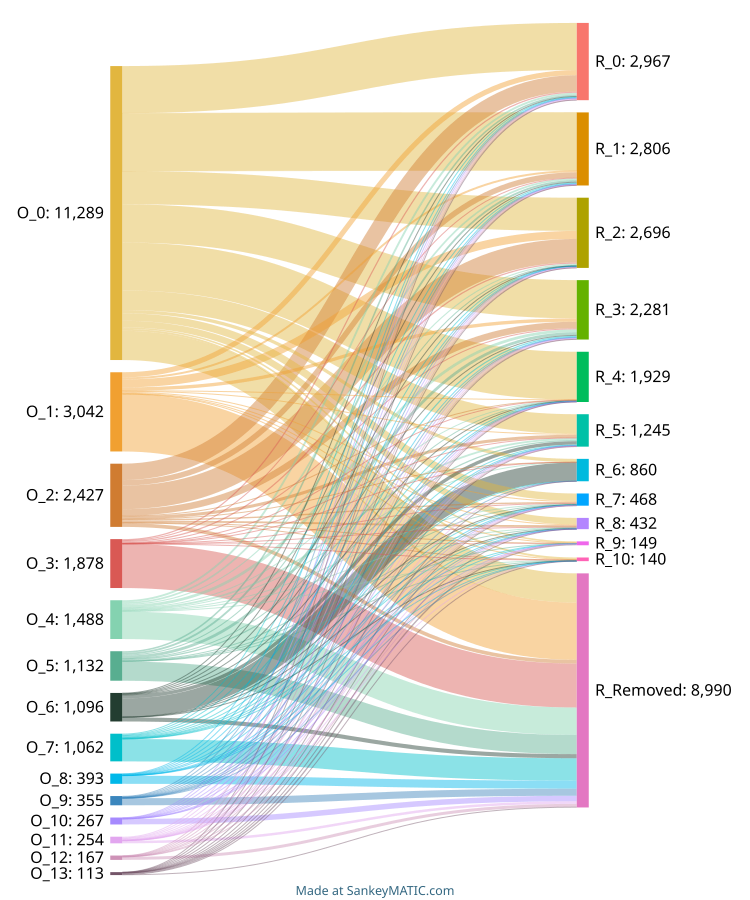

In [20]:
display_svg(file="inputs/zenodo/rebuttal/wheeler_rebuttal_sankey.svg")  

We can see out of the 1,878 cells in the original Cluster 3 (O_3), labeled as epigenetic memory astrocytes, the vast majority were removed by the authors' filtering in their rebuttal (R_Removed). The new cluster labeled epigenetic memory astrocyte (Cluster 9/R_9) is very small, containing only 149 cells. 

Let's check exactly how many cells from original Cluster 3 remain in the dataset: 

In [21]:
table(wheeler_rebuttal$original_cluster)


    0     1     2     3     4     5     6     7     8     9    10    11    12 
10167   842  2286   187   435   397   938   204    81    84    54   157    52 
   13 
   89 

Only 187 of the cells originally labeled as epigenetic memory astrocytes remain in this dataset following the new filtering approach, meaning 90% of the original epigenetic memory astrocyte cluster cells were eliminated with removal of non-astrocyte cell types and quality control filtering. 

The authors claimed in their rebuttal that their finding of a population with an elevated epigenetic memory astrocyte signature enrichment score following this more stringent filtering demonstrates the memory phenotype is not related to cell type contamination or expression of non-astrocyte cell type markers. However, the fact that almost all of the originally labeled epigenetic memory astrocyte cells were removed seems to directly contradict that claim.

Let's evaluate how many of the remaining 187 cells from original Cluster 3 (O_3) are now members of the new epigenetic memory astrocyte population (Cluster 9/R_9):

In [22]:
table(wheeler_rebuttal[,WhichCells(wheeler_rebuttal, expression = `original_cluster` == '3')]$seurat_clusters)


 0  1  2  3  4  5  6  7  8  9 10 
48 19 49 40  3  9  1  9  4  4  1 

***Just 4 out of the 1,878 cells originally labeled as epigenetic memory astrocytes by Lee et al remain labeled as such in their rebuttal reanalysis*** (only 0.2% of the original cluster). This seems to directly contradict the claim that the epigenetic memory astrocyte phenotype is unrelated to non-astrocyte cell type contamination. 

We'll next calculate enrichment scores for the uncorrected and corrected up-signature and FIND-seq derived signature gene sets. 

In [23]:
# uncorrected up-signature
signatures = read_excel('inputs/zenodo/supplementary_tables/41586_2024_7187_MOESM4_ESM.xlsx')
up_signature = signatures %>% filter(log2FoldChange > 0) %>% .$gene
down_signature = signatures %>% filter(log2FoldChange < 0) %>% .$gene

# corrected up-signature
IL1bTNF_2x_vs_1x = read.csv('inputs/zenodo/2x.IL1B.and.TNF.vs.1x.IL1B.dge.tsv', sep = '\t')
IL1bTNF_2x_vs_PBS = read.csv('inputs/zenodo/IL1B.and.TNF.vs.PBS.SPF.2X.dge.tsv', sep = '\t')
sig_IL1bTNF_2x_vs_1x = IL1bTNF_2x_vs_1x %>% filter(abs(log2FoldChange) > 1.5) %>% filter(padj < 0.05)
up_IL1bTNF_2x_vs_PBS = IL1bTNF_2x_vs_PBS %>% filter(log2FoldChange > 1) %>% filter(padj < 0.05)
corrected_upsignature = sig_IL1bTNF_2x_vs_1x %>% filter(log2FoldChange > 1.5) %>% filter(gene %in% rownames(up_IL1bTNF_2x_vs_PBS)) %>% .$gene

# corrected down-signature
down_IL1bTNF_2x_vs_PBS = IL1bTNF_2x_vs_PBS %>% filter(log2FoldChange < -1) %>% filter(padj < 0.05)
corrected_downsignature = sig_IL1bTNF_2x_vs_1x %>% filter(log2FoldChange < -1.5) %>% filter(gene %in% rownames(down_IL1bTNF_2x_vs_PBS)) %>% .$gene

# find-seq gene signature
findseq = read_excel('inputs/zenodo/supplementary_tables/41586_2024_7187_MOESM10_ESM.xlsx', col_names = FALSE)
findseq = findseq$`...1`

New names:
• `` -> `...1`


In [24]:
wheeler_rebuttal <- AddModuleScore(wheeler_rebuttal, features = list(up_signature, corrected_upsignature, down_signature, corrected_downsignature, findseq), name = 'SIGNATURE')

Warning message:
“The following features are not present in the object: Ubb-ps, Ecrg4, H2az1, Aopep, Gm48942, Rpl15-ps3, Rps12-ps3, Gm29408, Gm5641, Rps7-ps3, Gm20400, Gm29371, Gm12505, Gm48377, Gm47922, 1700030N03Rik, Gm45551, Gm42031, CT868690.1, Reg3g, Nlrp12, AC241534.1, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Septin4, Myorg, Mtarc2, Gm48309, Mtss2, Gm17132, H2aw, Gask1a, Tafa5, Kcnj15, Gm42785, Gm50367, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Myorg, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: 1700110I01Rik, AC113595.1, Gm10062, Gm19220, Gm22146, Gm25190, Gm25197, Gm25735, Gm28017, Gm38152, Gm38302, Gm43540, Gm43652, Gm47031, Gm47164, Gm47551, Gm47578, Gm47673, Gm48216, Gm48269, Gm48271, Gm48309, Gm48600, Gm48610, Gm48942, Gm6899, Olfr907, Rpl15-ps3, Rps12-ps3, Septin11, Ubb-ps, not searc

Let's compare the authors' scores provided in the `memory.signature.up1` metadata slot to those we obtain when using the uncorrected or corrected up-signature gene sets.

In [25]:
score_df = data.frame('authors_upsig' = wheeler_rebuttal$memory.signature.up1, 'authors_downsig' = wheeler_rebuttal$memory.signature.down2, 'authors_memory_score' = wheeler_rebuttal$memory_signature_score, 
                      'original_upsig' = wheeler_rebuttal$SIGNATURE1, 'corrected_upsig' = wheeler_rebuttal$SIGNATURE2, 
                      'original_downsig' = wheeler_rebuttal$SIGNATURE3, 'corrected_downsig' = wheeler_rebuttal$SIGNATURE4, 'findseq' = wheeler_rebuttal$SIGNATURE5, 'cluster' = wheeler_rebuttal$seurat_clusters)

Warning message:
“The dot-dot notation (`..rr.label..`) was deprecated in ggplot2 3.4.0.
ℹ Please use `after_stat(rr.label)` instead.”


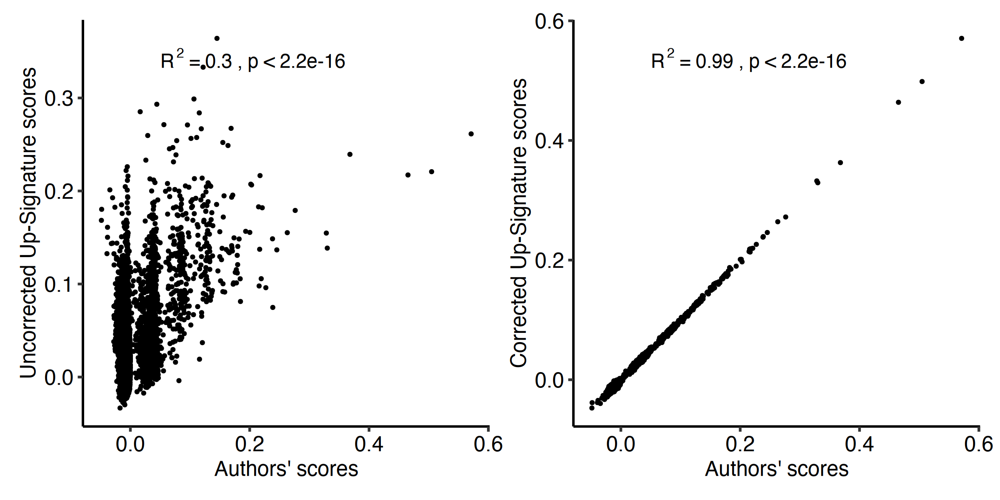

In [26]:
options(repr.plot.width=8, repr.plot.height=4, repr.plot.res = 300)
    p1 <- ggplot(data = score_df, aes(x = authors_upsig, y = original_upsig)) + 
        geom_point(size = 0.5) + 
        stat_cor(aes(label = paste(..rr.label.., ..p.label.., sep = "~`,`~")), label.x = 0.05) + 
        labs(x = "Authors' scores", y = 'Uncorrected Up-Signature scores') + 
        theme_pubr()

    p2 <- ggplot(data = score_df, aes(x = authors_upsig, y = corrected_upsig)) + 
        geom_point(size = 0.5) + 
        stat_cor(aes(label = paste(..rr.label.., ..p.label.., sep = "~`,`~")), label.x = 0.05) + 
        labs(x = "Authors' scores", y = 'Corrected Up-Signature scores') + 
        theme_pubr()

    image <- p1 + p2

    ggsave(file="outputs/figures/wheeler_rebuttal_signature_scores_scatterplot.png", plot=image, width=8, height=4)

    image

It appears like the authors used the corrected up-signature gene set for their enrichment scoring. How does this score correlate with the FIND-seq enrichment score (two read-outs of the same purported state)?

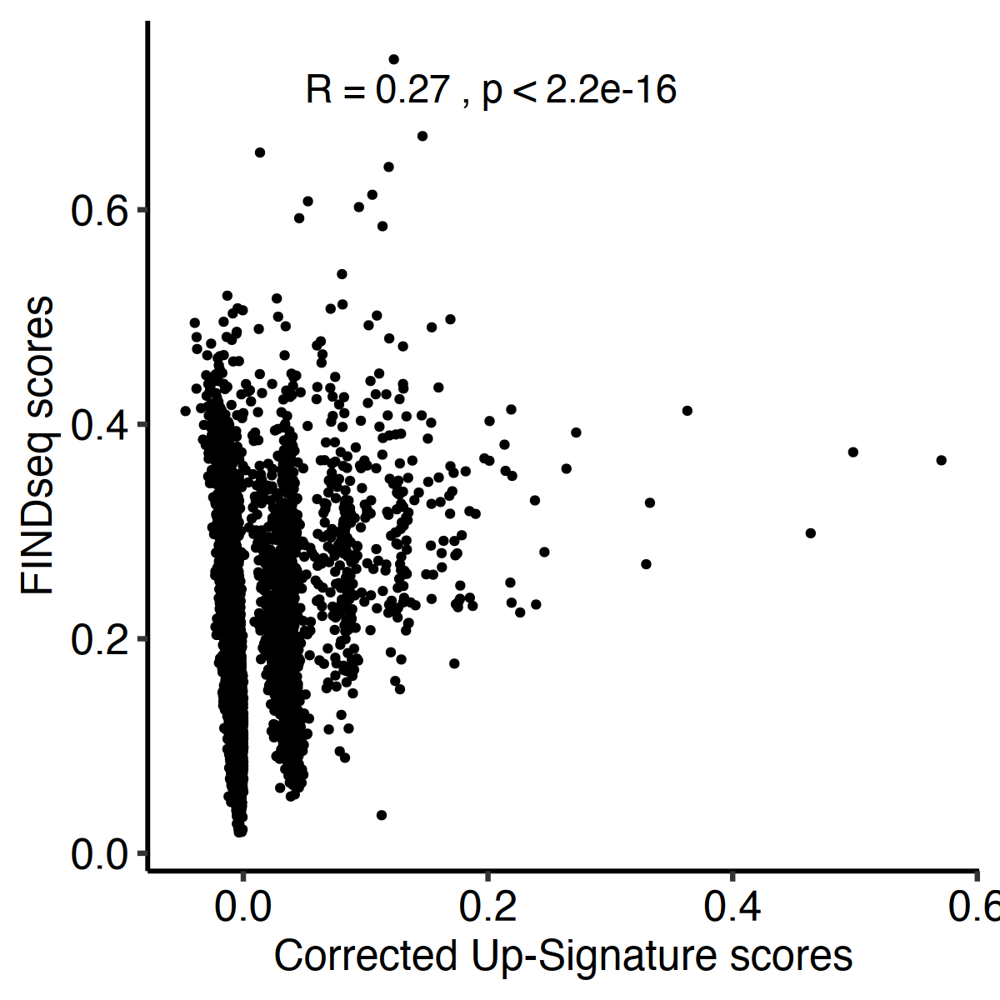

In [27]:
options(repr.plot.width=4, repr.plot.height=4, repr.plot.res = 300)
    p1 <- ggplot(data = score_df, aes(x = corrected_upsig, y = findseq)) + 
        geom_point(size = 0.5) + 
        stat_cor(aes(label = paste(..r.label.., ..p.label.., sep = "~`,`~")), label.x = 0.05) + 
        labs(x = "Corrected Up-Signature scores", y = 'FINDseq scores') + 
        theme_pubr()

    ggsave(file="outputs/figures/wheeler_rebuttal_findseq_vs_corrected_upsignature_scores_scatterplot.png", plot=p1, width=4, height=4)

    p1

Let's take a look at the FIND-seq enrichment score across the new clusters: 

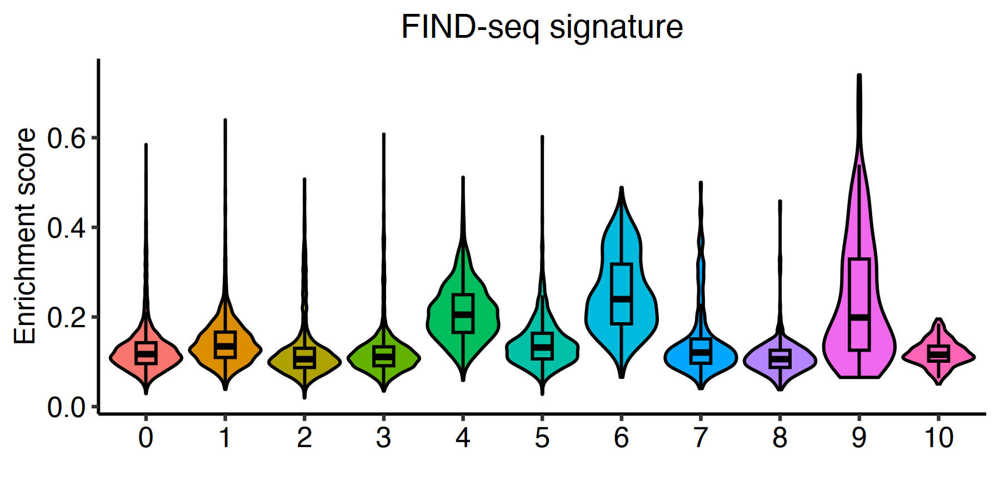

In [28]:
options(repr.plot.width=6, repr.plot.height=3, repr.plot.res = 300)
image = ggplot(score_df, aes(x = cluster, y = findseq)) + 
    geom_violin(aes(fill = cluster), color = 'black', 
                scale = 'width', adjust = 1) + 
    geom_boxplot(aes(fill = cluster), color = 'black', outlier.shape = NA, width = 0.25) + 
    labs(x = '', y = 'Enrichment score', title = 'FIND-seq signature') + theme_pubr() + NoLegend() + 
    theme(plot.title = element_text(face = 'bold', size = 14, hjust=0.5))

ggsave(file="outputs/figures/wheeler_rebuttal_findseq_scores.svg", plot=image, width=6, height=3, dpi = 600)

image

While the FIND-seq signature enrichment score is higher in Cluster 9 (the new epigenetic memory astrocyte cluster) than some clusters, this enrichment is certainly not specific to Cluster 9. Let's evalute this with a Wilcoxon Rank-Sum test:

In [29]:
signature5_results <- data.frame('comparison' = c(), 'stat' = c(), 'estimate' = c(), 'conf_lower' = c(), 'conf_upper' = c(), 'pval' = c())

for(i in c('0', '1', '2', '3', '4', '5', '6', '7', '8', '10')){
    wilx_res =  wilcox.test(wheeler_rebuttal[,WhichCells(wheeler_rebuttal, idents = '9')]$SIGNATURE5, 
            wheeler_rebuttal[,WhichCells(wheeler_rebuttal, idents = i)]$SIGNATURE5, 
            conf.int = TRUE, 
            exact = FALSE)  

    tmp = data.frame('comparison' = paste0('Cluster 9 vs ', i), 'stat' = wilx_res$statistic, 
                     'estimate' = wilx_res$estimate, 'conf_lower' = wilx_res$conf.int[1], 'conf_upper' = wilx_res$conf.int[2], 
                     'pval' = wilx_res$p.value)

    signature5_results <- rbind(signature5_results, tmp)
}

signature5_results$pval_adj <- p.adjust(signature5_results$pval, method = 'bonferroni')

write.table(signature5_results, 
            'outputs/wheeler_rebuttal_FINDseq_gene_signature_enrichment_wilcoxon_test.csv', sep = ',', 
            quote = FALSE, row.names = FALSE, col.names = TRUE)

signature5_results

,comparison,stat,estimate,conf_lower,conf_upper,pval,pval_adj
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
W,Cluster 9 vs 0,340248,0.0761171747,0.05845340,0.09695056,9.567000e-29,9.567000e-28
W1,Cluster 9 vs 1,294793,0.0619128326,0.04447426,0.08302944,2.934431e-17,2.934431e-16
W2,Cluster 9 vs 2,322244,0.0826829067,0.06529176,0.10330985,1.649983e-35,1.649983e-34
W3,Cluster 9 vs 3,272592,0.0830793444,0.06495665,0.10424748,3.716615e-35,3.716615e-34
W4,Cluster 9 vs 4,143808,0.0001226756,-0.01731663,0.01981997,9.890326e-01,1.000000e+00
W5,Cluster 9 vs 5,132351,0.0631006949,0.04532253,0.08467880,1.501231e-17,1.501231e-16
W6,Cluster 9 vs 6,53159,-0.0342856434,-0.05219407,-0.01492311,8.929485e-04,8.929485e-03
W7,Cluster 9 vs 7,51092,0.0653236812,0.04719673,0.08821830,1.108657e-17,1.108657e-16
W8,Cluster 9 vs 8,53790,0.0911615061,0.07057476,0.11565462,2.200660e-34,2.200660e-33


We can see that Cluster 9's FIND-seq scores are not significantly different than Cluster 4, and are actually significantly lower than Cluster 6.

Let's examine the corrected up-signature's enrichment scores across the new clusters: 

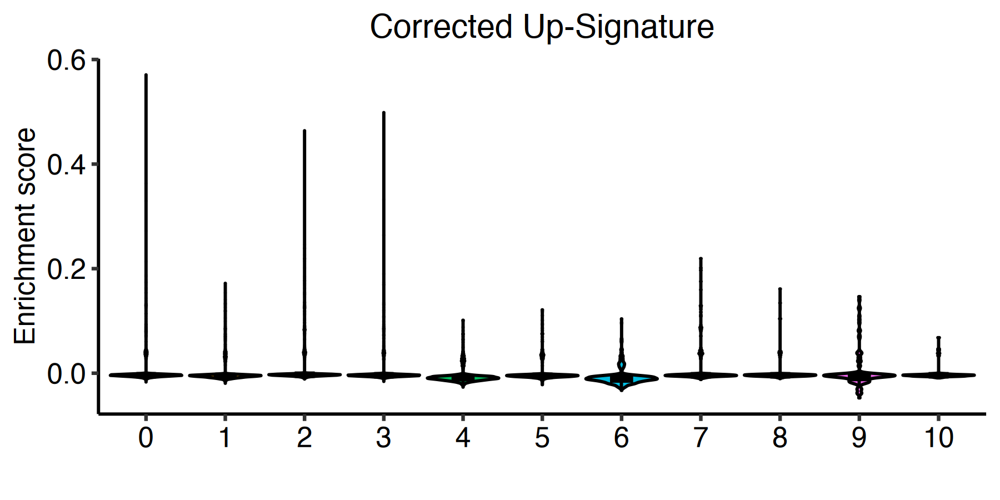

In [30]:
options(repr.plot.width=6, repr.plot.height=3, repr.plot.res = 300)
image = ggplot(score_df, aes(x = cluster, y = corrected_upsig)) + 
    geom_violin(aes(fill = cluster), color = 'black', 
                scale = 'width', adjust = 1) + 
    geom_boxplot(aes(fill = cluster), color = 'black', outlier.shape = NA, width = 0.25) + 
    labs(x = '', y = 'Enrichment score', title = 'Corrected Up-Signature') + theme_pubr() + NoLegend() + 
    theme(plot.title = element_text(face = 'bold', size = 14, hjust=0.5))

ggsave(file="outputs/figures/wheeler_rebuttal_corrected_upsignature_scores.svg", plot=image, width=6, height=3, dpi = 600)

image

Concerningly, we see absolutely no enrichment of the corrected up-signature gene set across the new clusters, not least Cluster 9. Let's evaluate this with a Wilcoxon Rank-Sum test: 

In [31]:
signature2_results <- data.frame('comparison' = c(), 'stat' = c(), 'estimate' = c(), 'conf_lower' = c(), 'conf_upper' = c(), 'pval' = c())

for(i in c('0', '1', '2', '3', '4', '5', '6', '7', '8', '10')){
    wilx_res =  wilcox.test(wheeler_rebuttal[,WhichCells(wheeler_rebuttal, idents = '9')]$SIGNATURE2, 
            wheeler_rebuttal[,WhichCells(wheeler_rebuttal, idents = i)]$SIGNATURE2, 
            conf.int = TRUE, 
            exact = FALSE)  

    tmp = data.frame('comparison' = paste0('Cluster 9 vs ', i), 'stat' = wilx_res$statistic, 
                     'estimate' = wilx_res$estimate, 'conf_lower' = wilx_res$conf.int[1], 'conf_upper' = wilx_res$conf.int[2], 
                     'pval' = wilx_res$p.value)

    signature2_results <- rbind(signature2_results, tmp)
}

signature2_results$pval_adj <- p.adjust(signature2_results$pval, method = 'bonferroni')

write.table(signature2_results, 
            'outputs/wheeler_rebuttal_corrected_upsig_gene_signature_enrichment_wilcoxon_test.csv', sep = ',', 
            quote = FALSE, row.names = FALSE, col.names = TRUE)

signature2_results

,comparison,stat,estimate,conf_lower,conf_upper,pval,pval_adj
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
W,Cluster 9 vs 0,171448.0,-0.0015773757,-0.002356435,-0.0008974957,3.692634e-06,3.692634e-05
W1,Cluster 9 vs 1,201127.0,-0.0002887404,-0.001095222,0.0004383472,4.351745e-01,1.000000e+00
W2,Cluster 9 vs 2,129079.5,-0.0024762924,-0.003285710,-0.0017400401,1.935448e-13,1.935448e-12
W3,Cluster 9 vs 3,136940.5,-0.0013220912,-0.002057544,-0.0006607472,7.001817e-05,7.001817e-04
W4,Cluster 9 vs 4,183199.0,0.0033164483,0.002300410,0.0043080246,2.194912e-08,2.194912e-07
W5,Cluster 9 vs 5,84940.0,-0.0006294964,-0.001513725,0.0000819196,9.252227e-02,9.252227e-01
W6,Cluster 9 vs 6,84365.0,0.0046063798,0.003311300,0.0059700017,6.423198e-10,6.423198e-09
W7,Cluster 9 vs 7,26842.0,-0.0017886568,-0.002839575,-0.0009215806,2.296351e-05,2.296351e-04
W8,Cluster 9 vs 8,25154.5,-0.0013914417,-0.002217036,-0.0006962974,6.943541e-05,6.943541e-04


The corrected up-signature enrichment scores for Cluster 9 are LOWER or not statistically different compared to all other clusters with the exception of Clusters 4 & 6 (which paradoxically have equivalent or higher, respectively, FIND-seq enrichment scores than Cluster 9).

Let's examine expression of the up-signature genes across the clusters using a dot plot, to better visualization the percentage of cells expressing each gene within each cluster: 

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


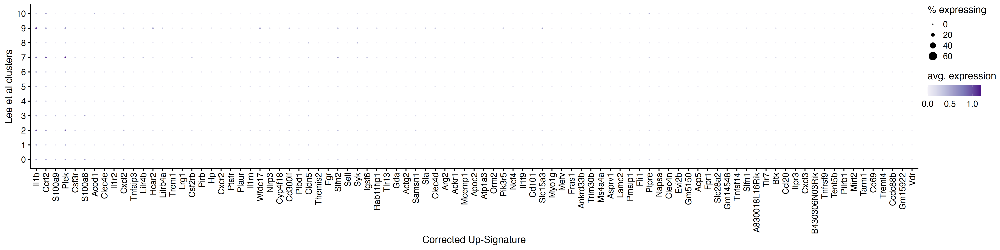

In [32]:
options(repr.plot.width=20, repr.plot.height=5, repr.plot.res = 300, warn = -1)

image = DotPlot(wheeler_rebuttal, features = corrected_upsignature, assay = 'RNA', group.by = 'seurat_clusters', scale = FALSE, scale.min = 0, scale.max = 75) + 
    scale_color_distiller(palette = 'Purples', direction = 1, breaks = scales::pretty_breaks(n = 4)) + 
    guides(color = guide_colorbar(title = 'avg. expression', direction = "horizontal", title.position = "top"),
          size = guide_legend(title = "% expressing")) + 
    labs(y = 'Lee et al clusters', x = 'Corrected Up-Signature', color = NULL, size = '% expressing') + 
    theme(axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5, face = 'italic'), legend.justification = "top")

ggsave(file="outputs/figures/wheeler_rebuttal_corrected_upsignature_dotplot.svg", plot=image, width=20, height=5, dpi = 600)

image

options(warn = 0)

It appears almost no cells express any of the corrected up-signature genes. Let's adjust the maximum size of the dots so that we can see smaller percentages more easily:

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


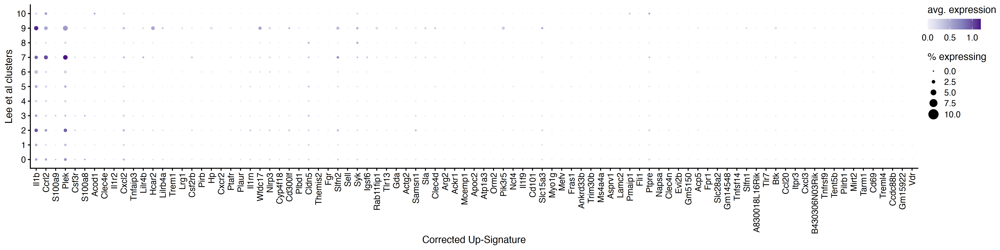

In [33]:
options(repr.plot.width=20, repr.plot.height=5, repr.plot.res = 300, warn = -1)

DotPlot(wheeler_rebuttal, features = corrected_upsignature, assay = 'RNA', group.by = 'seurat_clusters', scale = FALSE, scale.min = 0, scale.max = 10) + 
    scale_color_distiller(palette = 'Purples', direction = 1, breaks = scales::pretty_breaks(n = 4)) + 
    guides(color = guide_colorbar(title = 'avg. expression', direction = "horizontal", title.position = "top"),
          size = guide_legend(title = "% expressing")) + 
    labs(y = 'Lee et al clusters', x = 'Corrected Up-Signature', color = NULL, size = '% expressing') + 
    theme(axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5, face = 'italic'), legend.justification = "top")

There is effectively no expression of corrected up-signature genes across all clusters in the filtered rebuttal dataset.

Let's examine expression of the corrected up-signature gene set across all clusters at the sample level. To visualize sample heterogeneity, we'll first group cells into sample-cluster pseudobulks.

In [34]:
ag_rebuttal = AggregateExpression(wheeler_rebuttal, assays = 'RNA', group.by = c('seurat_clusters', 'sample_id'), return.seurat = TRUE)
pseudobulk_mat <- LayerData(ag_rebuttal, assay = 'RNA', layer = 'data', features = corrected_upsignature)

First group.by variable `seurat_clusters` starts with a number, appending `g` to ensure valid variable names
This message is displayed once every 8 hours.
Centering and scaling data matrix



pdf 
  2

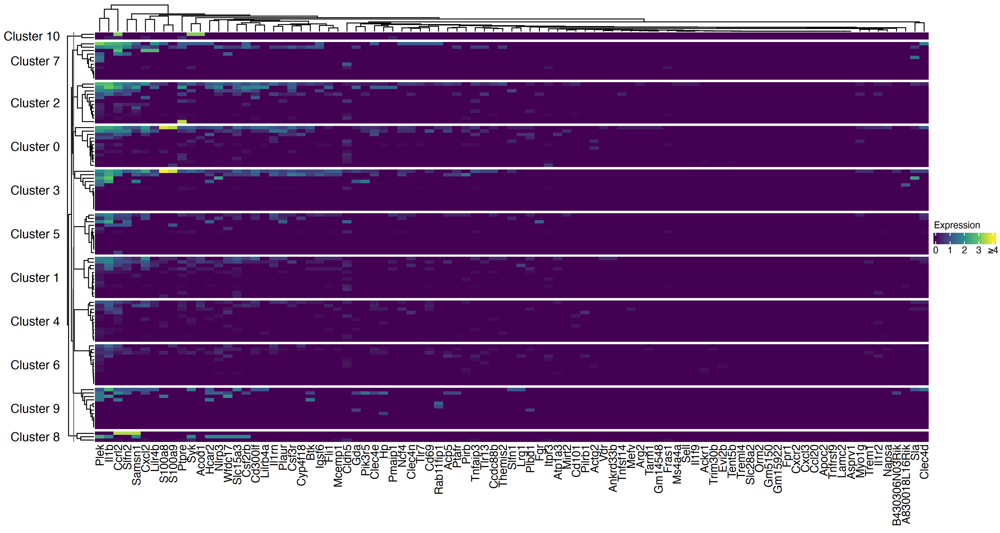

In [35]:
options(repr.plot.width=15, repr.plot.height=8, repr.plot.res = 300, warn = -1)

png("outputs/figures/wheeler_rebuttal_corrected_upsignature_pseudobulkheatmap.png",width=15,height=8,units="in",res=1200)

ht <- Heatmap(name = 'Expression', t(pseudobulk_mat), col = circlize::colorRamp2(breaks = c(0, 1, 2, 3, 4), colors = viridis(option = 'viridis', n = 5)),
       row_split = gsub("g", "Cluster ", ag_rebuttal$seurat_clusters), 
              row_title_rot = 0, 
              show_row_names = FALSE,
              show_column_names = TRUE,
              column_names_gp = gpar(fontface = "italic"),
              
      heatmap_legend_param = list(direction = 'horizontal', at = c(0, 1, 2, 3, 4), labels = c('0', "1", "2", "3", "≥4")))

draw(ht)

dev.off()

ht

options(warn = 0)

We can see that expression of the corrected up-signature gene set is not robustly increased across samples in any cluster, much less Cluster 9. Let's visualize expression across all single cells as well: 

In [36]:
exp_mat <- LayerData(wheeler_rebuttal, assay = 'RNA', layer = 'data', features = corrected_upsignature)

pdf 
  2

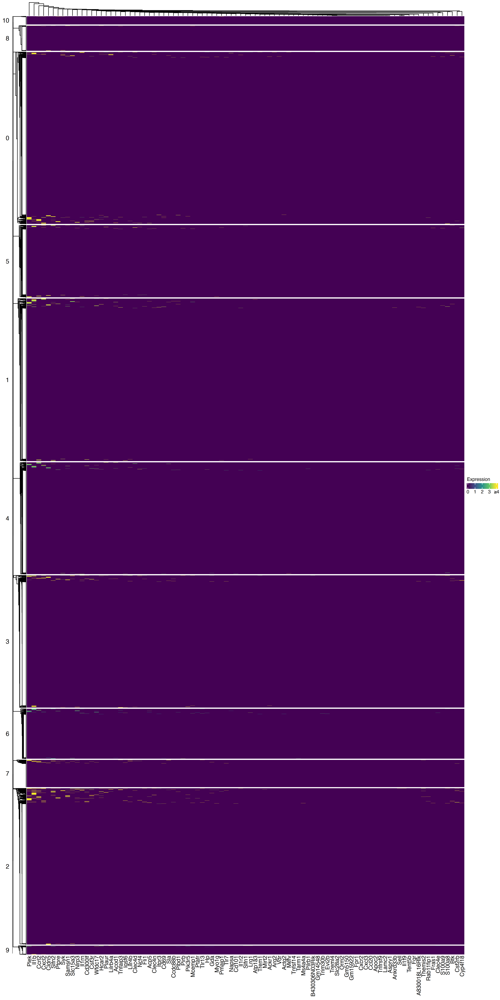

In [37]:
options(repr.plot.width=15, repr.plot.height=30, repr.plot.res = 300, warn = -1)

png("outputs/figures/wheeler_rebuttal_corrected_upsignature_singlecells_heatmap.png",width=15,height=30,units="in",res=1200)

ht <- Heatmap(name = 'Expression', t(as.matrix(exp_mat)), col = circlize::colorRamp2(breaks = c(0, 1, 2, 3, 4), colors = viridis(option = 'viridis', n = 5)),
       row_split = gsub("g", "Cluster ", wheeler_rebuttal$seurat_clusters), 
              row_title_rot = 0, 
              show_row_names = FALSE,
              show_column_names = TRUE,
              column_names_gp = gpar(fontface = "italic"),
              use_raster = FALSE,
      heatmap_legend_param = list(direction = 'horizontal', at = c(0, 1, 2, 3, 4), labels = c('0', "1", "2", "3", "≥4")))

draw(ht)

dev.off()

ht

options(warn = 0)

Again, it is clear that there is no enrichment of the corrected up-signature genes across the presented clusters, much less in Cluster 9. The presentation of Cluster 9 as epigenetic memory astrocytes in the authors' rebuttal thus appears not supported by the data.

How do the authors manage to show enrichment of the epigenetic memory astrocyte signature in the dot plots they present without significant expression of the up-signature? We see from code they've shared in their rebuttal that they in fact plotted not the up-signature, but rather a combination of the up-signature and down-signature. In particular, they subtract the up- and down-signature enrichment scores and plot the combined score in a dot plot. This is where their `memory_signature_score` metadata slot came from:

In [38]:
wheeler_rebuttal$corrected_combined_sig = wheeler_rebuttal$SIGNATURE2 - wheeler_rebuttal$SIGNATURE4

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Corrected Up-Signature enrichment —' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Corrected Up-Signature enrichment —' in 'mbcsToSbcs': dot substituted for <80>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Corrected Up-Signature enrichment —' in 'mbcsToSbcs': dot substituted for <94>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Corrected Up-Signature enrichment —' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Corrected Up-Signature enrichment —' in 'mbcsToSbcs': dot substituted for <80>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x

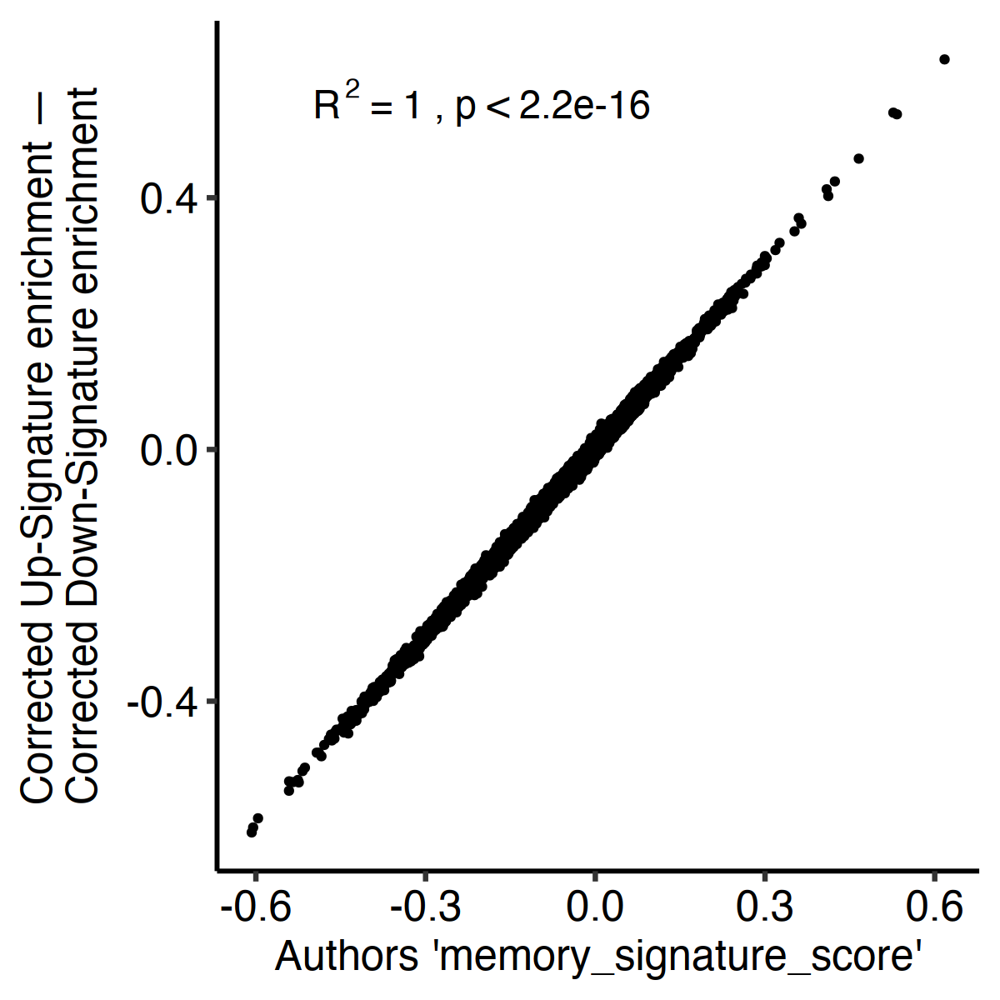

In [39]:
options(repr.plot.width=4, repr.plot.height=4, repr.plot.res = 300)
    p1 <- ggplot(data.frame(x = wheeler_rebuttal$corrected_combined_sig, y = wheeler_rebuttal$memory_signature_score), aes(x = x, y = y)) +  
        geom_point(size = 0.5) + 
        stat_cor(aes(label = paste(..rr.label.., ..p.label.., sep = "~`,`~")), label.x = -0.5) + 
        labs(x = "Authors 'memory_signature_score'", y = 'Corrected Up-Signature enrichment —\nCorrected Down-Signature enrichment') + 
        theme_pubr()

    ggsave(file="outputs/figures/wheeler_rebuttal_authorsscores_vs_subtracted_enrichmentscores_scatterplot.png", plot=p1, width=4, height=4)

    p1

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Corrected Up-Signature enrichment —' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Corrected Up-Signature enrichment —' in 'mbcsToSbcs': dot substituted for <80>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Corrected Up-Signature enrichment —' in 'mbcsToSbcs': dot substituted for <94>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Corrected Up-Signature enrichment —' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Corrected Up-Signature enrichment —' in 'mbcsToSbcs': dot substituted for <80>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x

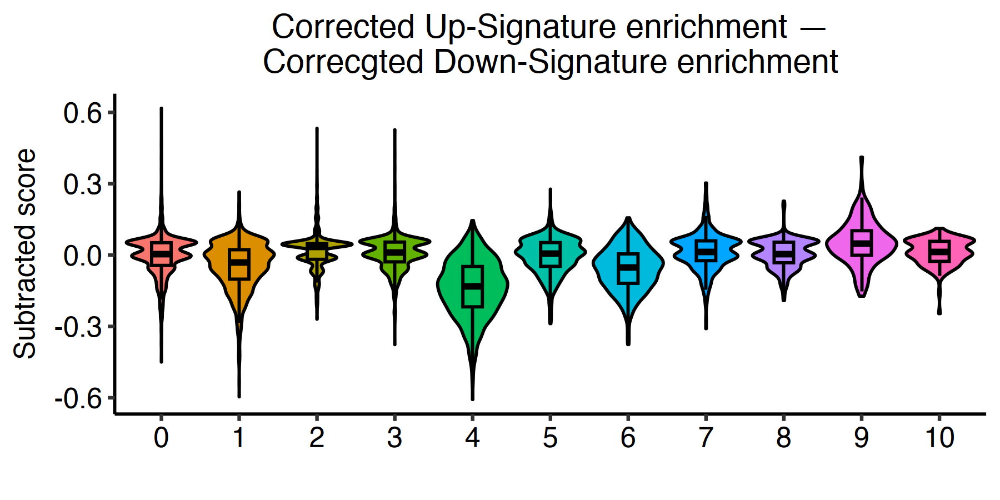

In [40]:
options(repr.plot.width=6, repr.plot.height=3, repr.plot.res = 300)
image = ggplot(score_df %>% mutate(combined = corrected_upsig-corrected_downsig), aes(x = cluster, y = combined)) + 
    geom_violin(aes(fill = cluster), color = 'black', 
                scale = 'width', adjust = 1) + 
    geom_boxplot(aes(fill = cluster), color = 'black', outlier.shape = NA, width = 0.25) + 
    labs(x = '', y = 'Subtracted score', title = 'Corrected Up-Signature enrichment —\nCorrecgted Down-Signature enrichment') + theme_pubr() + NoLegend() + 
    theme(plot.title = element_text(face = 'bold', size = 14, hjust=0.5))

ggsave(file="outputs/figures/wheeler_rebuttal_subtracted_combined_scores.svg", plot=image, width=6, height=3, dpi = 600)

image

In [41]:
combinedscore_results <- data.frame('comparison' = c(), 'stat' = c(), 'estimate' = c(), 'conf_lower' = c(), 'conf_upper' = c(), 'pval' = c())

for(i in c('0', '1', '2', '3', '4', '5', '6', '7', '8', '10')){
    wilx_res =  wilcox.test(wheeler_rebuttal[,WhichCells(wheeler_rebuttal, idents = '9')]$corrected_combined_sig, 
            wheeler_rebuttal[,WhichCells(wheeler_rebuttal, idents = i)]$corrected_combined_sig, 
            conf.int = TRUE, 
            exact = FALSE)  

    tmp = data.frame('comparison' = paste0('Cluster 9 vs ', i), 'stat' = wilx_res$statistic, 
                     'estimate' = wilx_res$estimate, 'conf_lower' = wilx_res$conf.int[1], 'conf_upper' = wilx_res$conf.int[2], 
                     'pval' = wilx_res$p.value)

    combinedscore_results <- rbind(combinedscore_results, tmp)
}

combinedscore_results$pval_adj <- p.adjust(combinedscore_results$pval, method = 'bonferroni')

write.table(combinedscore_results, 
            'outputs/wheeler_rebuttal_combinedscore_wilcoxon_test.csv', sep = ',', 
            quote = FALSE, row.names = FALSE, col.names = TRUE)

combinedscore_results

,comparison,stat,estimate,conf_lower,conf_upper,pval,pval_adj
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
W,Cluster 9 vs 0,296281,0.04714643,0.03297575,0.05965614,2.199202e-12,2.199202e-11
W1,Cluster 9 vs 1,319089,0.08693138,0.07137243,0.10275598,2.147950e-27,2.147950e-26
W2,Cluster 9 vs 2,257063,0.03181035,0.02027910,0.04660416,8.467708e-09,8.467708e-08
W3,Cluster 9 vs 3,222365,0.04100535,0.02753013,0.05307073,2.639097e-10,2.639097e-09
W4,Cluster 9 vs 4,259343,0.18469247,0.16665919,0.20307975,2.394032e-60,2.394032e-59
W5,Cluster 9 vs 5,125601,0.04978390,0.03672844,0.06343599,1.510689e-12,1.510689e-11
W6,Cluster 9 vs 6,102734,0.10522962,0.08932066,0.12115763,5.374984e-32,5.374984e-31
W7,Cluster 9 vs 7,43411,0.03347889,0.01774418,0.04851729,6.517617e-06,6.517617e-05
W8,Cluster 9 vs 8,42964,0.04402988,0.02918193,0.05707742,1.054837e-09,1.054837e-08


The combined scores, generated by subtracting the corrected down-signature enrichment scores from the corrected up-signature enrichment scores give the appearance that the epigenetic memory astrocyte signature is (slightly) higher in Cluster 9. This is entirely driven by a lower down-signature enrichment score in Cluster 9 compared to other clusters: 

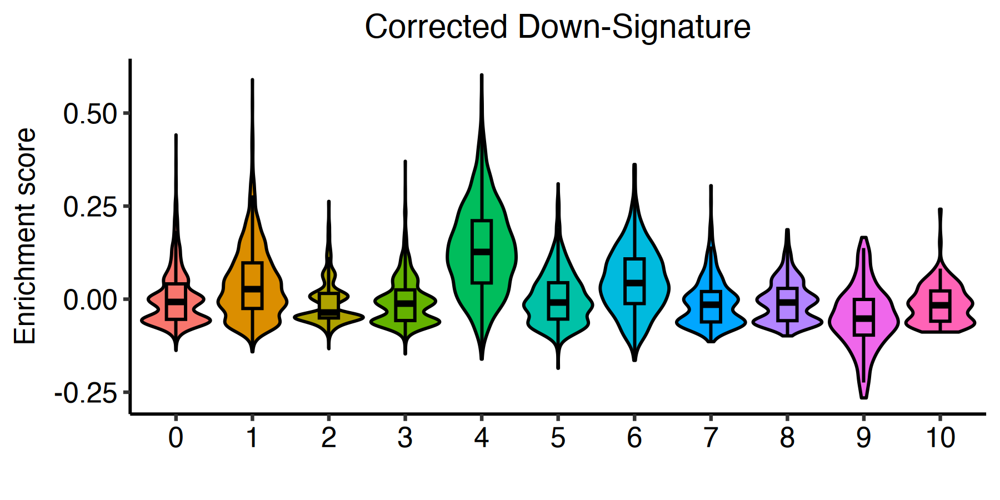

In [42]:
options(repr.plot.width=6, repr.plot.height=3, repr.plot.res = 300)
image = ggplot(score_df, aes(x = cluster, y = corrected_downsig)) + 
    geom_violin(aes(fill = cluster), color = 'black', 
                scale = 'width', adjust = 1) + 
    geom_boxplot(aes(fill = cluster), color = 'black', outlier.shape = NA, width = 0.25) + 
    labs(x = '', y = 'Enrichment score', title = 'Corrected Down-Signature') + theme_pubr() + NoLegend() + 
    theme(plot.title = element_text(face = 'bold', size = 14, hjust=0.5))

ggsave(file="outputs/figures/wheeler_rebuttal_corrected_downsignature_scores.svg", plot=image, width=6, height=3, dpi = 600)

image

The subtraction-based combination score thus gives the impression that Cluster 9 appears most like the epigenetic memory astrocyte phenotype, all without there being any appreciable expression of the up-signature marker genes purported to demarcate memory astrocytes from other astrocytes.

Using code provided by the authors in their rebuttal, we can now recapitulate the dot plot they presented to claim enrichment of the epigenetic memory astrocyte signatures in Cluster 9:

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Up-Sig —    ' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Up-Sig —    ' in 'mbcsToSbcs': dot substituted for <80>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Up-Sig —    ' in 'mbcsToSbcs': dot substituted for <94>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Up-Sig —    ' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Up-Sig —    ' in 'mbcsToSbcs': dot substituted for <80>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label

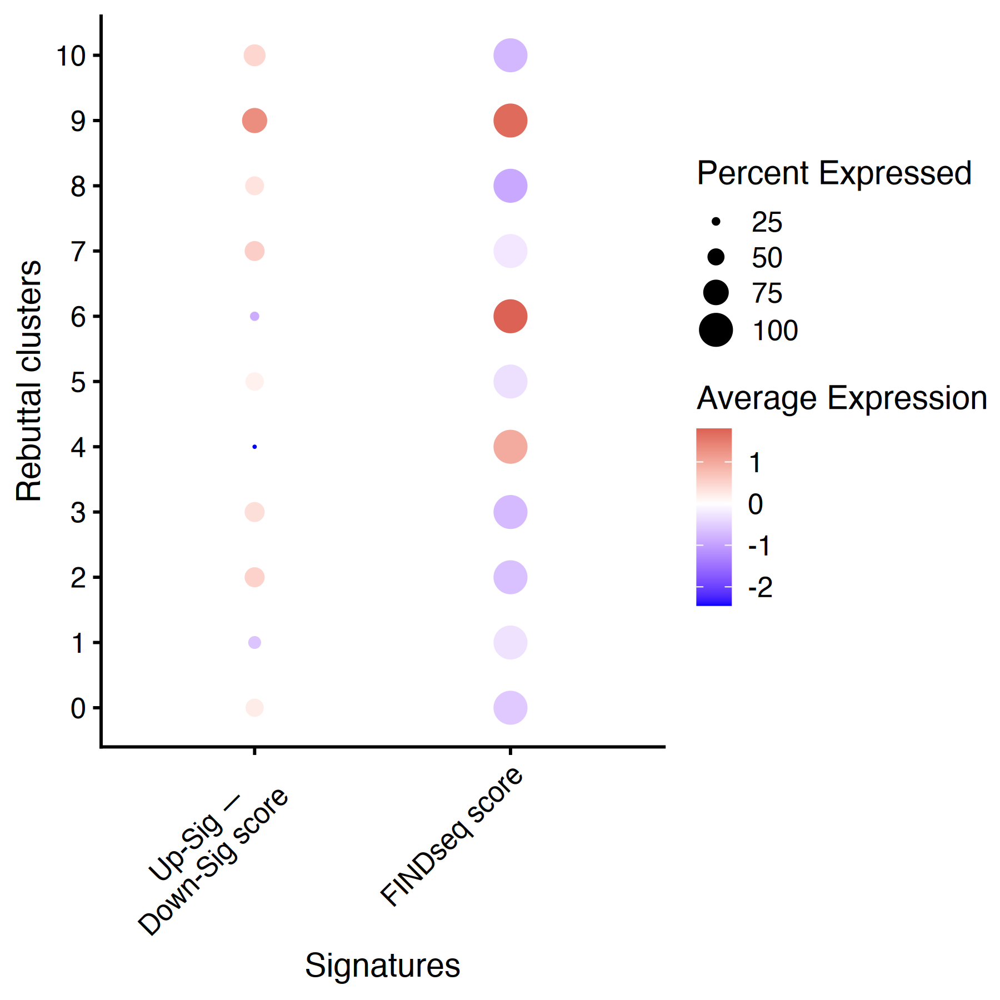

In [43]:
options(repr.plot.width=6, repr.plot.height=6, repr.plot.res = 300)
DotPlot(wheeler_rebuttal, features = c('corrected_combined_sig','SIGNATURE5'),group.by = 'seurat_clusters') + 
    labs(x = 'Signatures', y = 'Rebuttal clusters') + 
    scale_x_discrete(labels=c('Up-Sig —    \nDown-Sig score', 'FINDseq score')) + 
    scale_colour_gradient2(low = "blue", mid = "white",high = "#c1121f", space = "Lab",na.value = "grey50", guide = "colourbar") + 
    RotatedAxis()

While the presentation of these scores in z-scored average dot plots certainly obscures the amount of (or lack of) enrichment of these signatures across clusters, for illustration's sake we'll plot the same dot plot with the corrected up-signature enrichment scores instead of the subtracted combined score: 

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


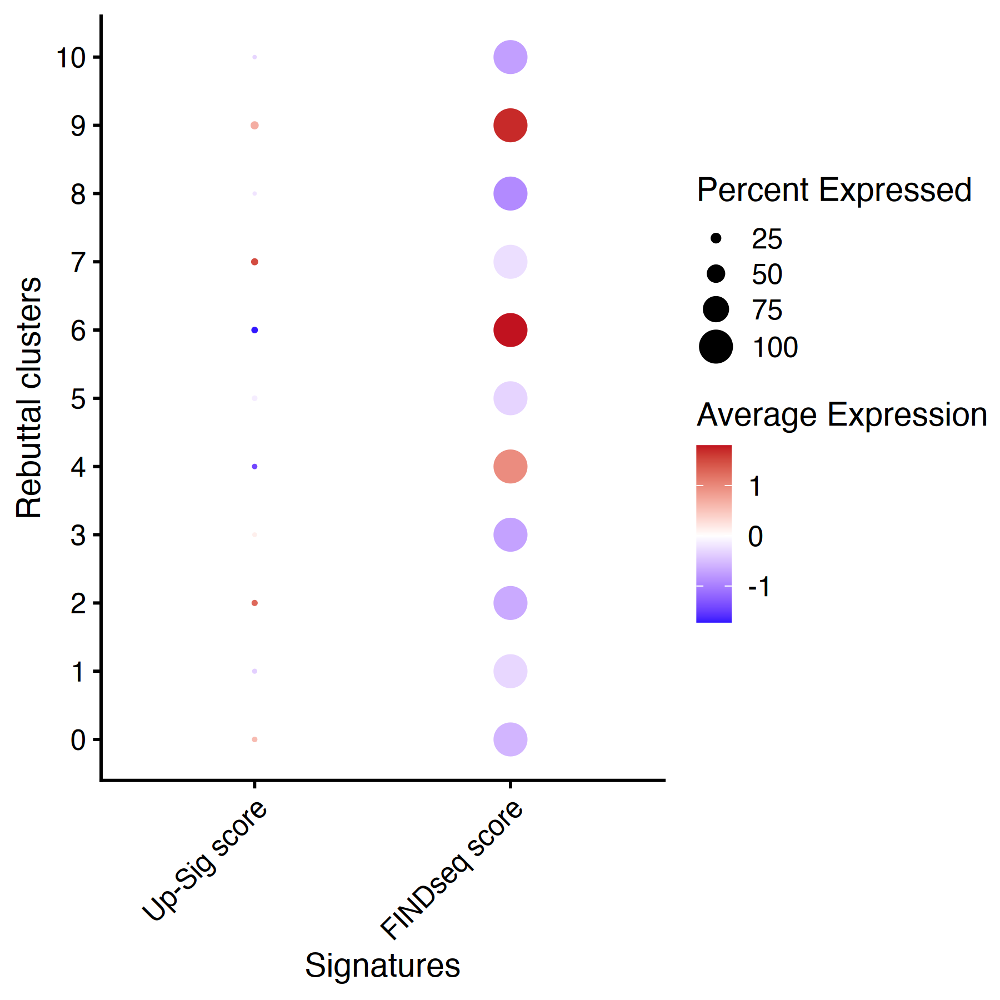

In [44]:
options(repr.plot.width=6, repr.plot.height=6, repr.plot.res = 300)
DotPlot(wheeler_rebuttal, features = c('SIGNATURE2','SIGNATURE5'),group.by = 'seurat_clusters') + 
    scale_x_discrete(labels=c('Up-Sig score', 'FINDseq score')) + 
    labs(x = 'Signatures', y = 'Rebuttal clusters') + 
    scale_colour_gradient2(low = "blue", mid = "white",high = "#c1121f", space = "Lab",na.value = "grey50", guide = "colourbar") + 
    RotatedAxis()

It's further worth mentioning that the Seurat `DotPlot` function generates the 'Percent Expressed' feature (the size of the presented dots) based on the proportion of cells in each cluster with a feature value > 0. Since `AddModuleScore` enrichment scores can be negative, this is not a very appropriate format to present these scores. We believe violin/box plots to be more informative. 

So why does Cluster 9 have a slightly lower down-signature enrichment score compared to other clusters, thus driving the combined score presented by the authors in their rebuttal? 

As we discuss in the Step 7 & 8 notebooks, the corrected down-signature includes genes most highly expressed by astrocytes compared to other cell types, as we believe condition-skewed cell type contamination likely affected the original cytokine treatment bulk RNA-seq experiment. Astrocytes thus will have a higher enrichment of the down-signature gene set than non-astrocytes. We thus hypothesized that Cluster 9 may be a non-astrocyte cell type. 

Let's examine marker genes for each cluster in the authors' rebuttal dataset to evaluate whether any non-astrocyte cell type contamination remains.

In [45]:
# geometric mean with static pseudocount (Scanpy log2FC formula)
mean.fxn_geo <- function(x) {
    return(log(x = (expm1(rowMeans(x = x)) + 1e-9), base = 2))
}

# create an empty list for comparing FoldChange calculation results across all clusters
presto_results <- data.frame()

for(i in levels(Idents(wheeler_rebuttal))){ # loop through all clusters
    
    print(paste0("Calculating markers for cluster ", i))
    
    data <- GetAssayData(object = wheeler_rebuttal[['RNA']], layer = "data")
    
    # get cell names for groupings (from differential_expression.R line 1701-1749 [https://github.com/satijalab/seurat/blob/master/R/differential_expression.R#L1701])
    IdentsToCells <- function(
      object,
      ident.1,
      ident.2,
      cellnames.use
    ) {
      #
      if (is.null(x = ident.1)) {
        stop("Please provide ident.1")
      } 
      if (length(x = as.vector(x = ident.1)) > 1 &&
          any(as.character(x = ident.1) %in% cellnames.use)) {
        bad.cells <- cellnames.use[which(x = !as.character(x = ident.1) %in% cellnames.use)]
        if (length(x = bad.cells) > 0) {
          stop(paste0("The following cell names provided to ident.1 are not present in the object: ", paste(bad.cells, collapse = ", ")))
        }
      } else {
        ident.1 <- WhichCells(object = object, idents = ident.1)
      }
      # if NULL for ident.2, use all other cells
      if (length(x = as.vector(x = ident.2)) > 1 &&
          any(as.character(x = ident.2) %in% cellnames.use)) {
        bad.cells <- cellnames.use[which(!as.character(x = ident.2) %in% cellnames.use)]
        if (length(x = bad.cells) > 0) {
          stop(paste0("The following cell names provided to ident.2 are not present in the object: ", paste(bad.cells, collapse = ", ")))
        }
      } else {
        if (is.null(x = ident.2)) {
          ident.2 <- setdiff(x = cellnames.use, y = ident.1)
        } else {
          ident.2 <- WhichCells(object = object, idents = ident.2)
        }
      }
      return(list(cells.1 = ident.1, cells.2 = ident.2))
    }
    
    # extract cell lists using IdentsToCells function
    cells <- IdentsToCells(object = wheeler_rebuttal, ident.1 = i, ident.2 = NULL, cellnames.use = colnames(wheeler_rebuttal))
    cells.1 <- cells$cells.1
    cells.2 <- cells$cells.2

    # order data matrix by group
    data <- data[, c(cells.1, cells.2), drop = FALSE]

    # calculate Scanpy fold change
    data.1 <- mean.fxn_geo(data[, cells.1, drop = FALSE])
    data.2 <- mean.fxn_geo(data[, cells.2, drop = FALSE])
    fc_geo <- (data.1 - data.2)

    # get group labels
    group.info <- data.frame(row.names = c(cells.1, cells.2))
    group.info[cells.1, "group"] <- "Group1"
    group.info[cells.2, "group"] <- "Group2"
    group.info[, "group"] <- factor(x = group.info[, "group"])

    # run presto wilcoxon test
    res <- wilcoxauc(X = data, y = group.info[, "group"])
    res <- res[1:(nrow(x = res)/2),]
    res$cluster <- i
    res$log2FC = fc_geo

    res$padj <- NULL
    res$logFC <- NULL
    res$group <- NULL
    
    
    res$p_val_adj = p.adjust(
      p =res$pval,
      method = "bonferroni",
      n = nrow(data)
    )
    
    presto_results <- rbind(presto_results, res)

}
# replace zero p-values with more accurate minimum value representable
presto_results = presto_results %>% mutate(p_val_adj = ifelse(p_val_adj == 0, .Machine$double.xmin, p_val_adj))

(presto_results %>% filter(cluster == '9') %>% arrange(p_val_adj, desc(log2FC)))[1:30,]

[1] "Calculating markers for cluster 0"
[1] "Calculating markers for cluster 1"
[1] "Calculating markers for cluster 2"
[1] "Calculating markers for cluster 3"
[1] "Calculating markers for cluster 4"
[1] "Calculating markers for cluster 5"
[1] "Calculating markers for cluster 6"
[1] "Calculating markers for cluster 7"
[1] "Calculating markers for cluster 8"
[1] "Calculating markers for cluster 9"
[1] "Calculating markers for cluster 10"


,feature,avgExpr,statistic,auc,pval,pct_in,pct_out,cluster,log2FC,p_val_adj
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
1,Odf3b,0.3430843,1320910,0.5602354,0.000000e+00,12.080537,0.031597573,9,8.491003,2.225074e-308
2,Iqca,0.3502766,1336638,0.5669063,0.000000e+00,13.422819,0.037917088,9,8.170899,2.225074e-308
3,Meig1,0.3981559,1352003,0.5734230,0.000000e+00,14.765101,0.075834176,9,7.646799,2.225074e-308
4,Tmem212,0.6705075,1398235,0.5930313,0.000000e+00,18.791946,0.189585440,9,7.257169,2.225074e-308
5,Enkur,0.5978711,1429540,0.6063089,0.000000e+00,21.476510,0.195904954,9,6.924553,2.225074e-308
6,1110017D15Rik,0.4567418,1367210,0.5798729,4.868918e-307,16.107383,0.120070779,9,7.007248,1.476110e-302
7,Rsph1,0.6027230,1413014,0.5992997,2.675247e-296,20.134228,0.246461072,9,6.515936,8.110546e-292
8,Fam183b,0.4410664,1359361,0.5765437,8.391143e-289,15.436242,0.120070779,9,7.092411,2.543943e-284
9,Dynlrb2,0.5320590,1389996,0.5895371,1.824510e-286,18.120805,0.195904954,9,6.661583,5.531366e-282


Save the differential expression test results to a CSV file:

In [46]:
write.table(presto_results %>% arrange(cluster, p_val_adj, desc(log2FC)), 
            'outputs/wheeler_rebuttal_clusters_de_test_results.csv', sep = ',', 
            quote = FALSE, row.names = FALSE, col.names = TRUE)

cluster9_sig_results <- presto_results %>% filter(cluster == '9') %>% filter(abs(log2FC) > 1) %>% 
    filter(p_val_adj < 0.05) %>% arrange(p_val_adj, desc(log2FC))
write.table(cluster9_sig_results, 'outputs/wheeler_rebuttal_cluster9_wilcoxon_test_results_DEGs.csv', sep = ',', 
            quote = FALSE, row.names = FALSE, col.names = TRUE)

Next, let's create a volcano plot of the differential expression data from Cluster 9, the cluster labeled as the new epigenetic memory astrocytes by Lee et al.

Warning message:
“Removed 15564 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 30306 rows containing missing values or values outside the scale range (`geom_text_repel()`).”
Warning message:
“Removed 15564 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 30306 rows containing missing values or values outside the scale range (`geom_text_repel()`).”


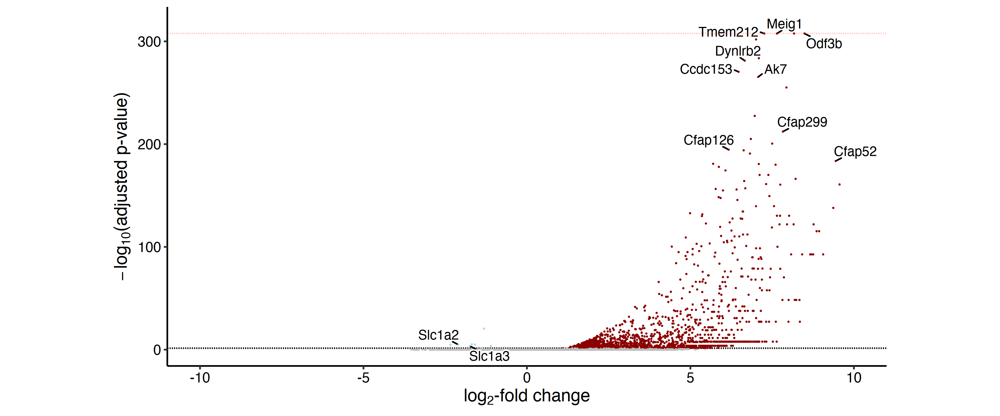

In [47]:
options(repr.plot.width=12, repr.plot.height=5, repr.plot.res = 300)

highlight_genes <- c('Ccdc153', 'Ak7', 'Tmem212', 'Dynlrb2', 'Cfap299', 'Cfap126', 'Cfap52', 'Odf3b', 'Meig1', 
                    'Slc1a3', 'Slc1a2')
image <- ggplot(data = presto_results %>% filter(cluster == "9") %>% mutate(label = ifelse(feature %in% highlight_genes, feature, NA)) %>% 
                                                                         mutate(significance = ifelse((p_val_adj < 0.05) & (log2FC > 1), "Up", 
                                                                                              ifelse((p_val_adj < 0.05) & (log2FC < -1), "Down",
                                                                                                    "NS"))), 
       aes(x = log2FC, y = -log10(p_val_adj), label = label, color = significance)) +
  geom_hline(yintercept = -log10(0.05), col = "black", linetype = 'dashed') + 
  rasterize(geom_point(size = 0.1), dpi = 1200) + 
    labs(x = expression(paste(log[2],"-fold change")), y = expression(paste(-log[10], "(adjusted p-value)"))) + 
    scale_color_manual(values = c('lightblue', 'gray', 'darkred'), guide = NULL) + 
     geom_text_repel(max.overlaps = Inf, segment.color = "black",
                    nudge_y = 2, min.segment.length = 0, 
                     fontface = 'italic',
                    bg.color = "white",
                     color = "black",
                     size = 4,
                    bg.r = .15) + 
    ylim(0, -log10(.Machine$double.xmin)+10) + 
    xlim(-10, 10) + 
    geom_hline(yintercept = -log10(.Machine$double.xmin), col = "red", linetype = 'dashed', alpha = 0.2) + 
    theme_pubr() + 
  theme(
              axis.title.y = element_text(size = 15),
              axis.title.x = element_text(size=15),
      aspect.ratio = 0.5
            )

ggsave(file="outputs/figures/wheeler_rebuttal_cluster9_markers_volcanoplot.svg", plot=image, width=12, height=5, dpi = 600)

image

options(warn = 0)

We can see that Cluster 9 is marked by ependymal cell markers and by lower expression of astrocyte markers *Slc1a3* and *Slc1a2*. This cluster appears to correspond to ependymal cell contamination.

Let's check how many cells are coming from each sample, as the authors claimed that Cluster 9 is 2.45-fold expanded in at the peak of EAE.

In [48]:
samples_df = data.frame('sample' = wheeler_rebuttal$sample_id, 'condition' = wheeler_rebuttal$Condition)
samples_df = samples_df[!duplicated(samples_df),]
rownames(samples_df) <- samples_df$sample
counts_df = as.data.frame(table(wheeler_rebuttal$seurat_clusters, wheeler_rebuttal$sample_id)[10,])
colnames(counts_df) <- 'counts'
counts_df = merge(samples_df, counts_df, by = 0, all = TRUE)
counts_df$condition <- factor(counts_df$condition, levels = c('Naive', 'Acute', 'Remitting'))
counts_df

Row.names,sample,condition,counts
<I<chr>>,<chr>,<fct>,<int>
GSM3721791,GSM3721791,Acute,11
GSM3721792,GSM3721792,Acute,8
GSM3721793,GSM3721793,Naive,17
GSM3721794,GSM3721794,Naive,7
GSM3721795,GSM3721795,Naive,10
GSM3721796,GSM3721796,Remitting,10
GSM3721797,GSM3721797,Remitting,35
GSM4002805,GSM4002805,Remitting,10
GSM4002806,GSM4002806,Acute,8


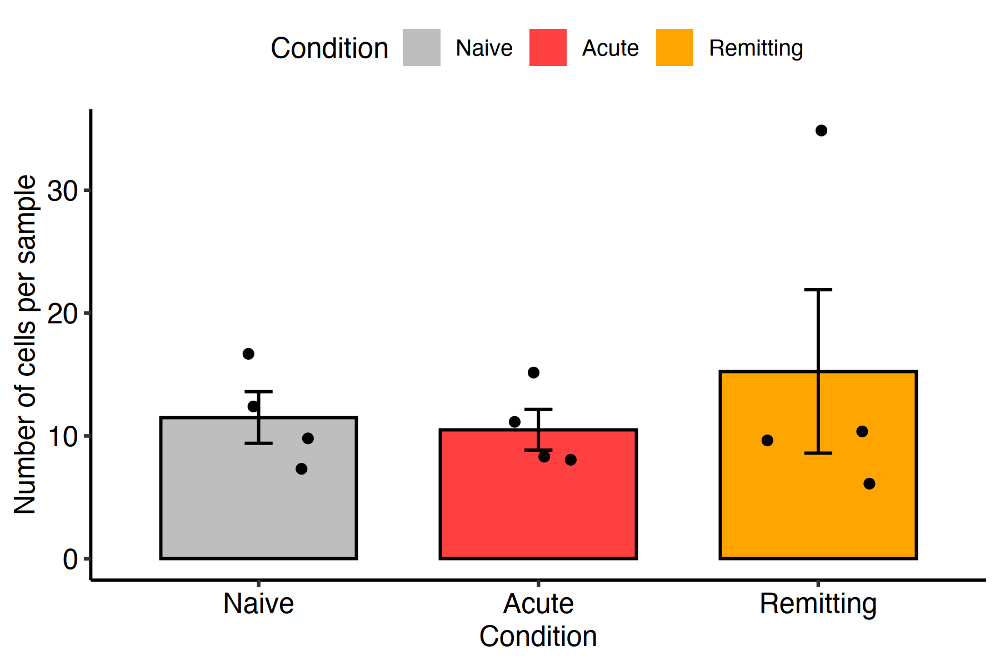

In [49]:
options(repr.plot.width=6, repr.plot.height=4, repr.plot.res = 300)

image = ggbarplot(counts_df, 
       x = 'condition', y = 'counts', color = 'condition', fill = 'condition', 
                 add=c('mean_se', 'jitter'), position = position_dodge(0.8)) + 
    labs(x = 'Condition', y = 'Number of cells per sample', fill = 'Condition') + 
    scale_color_manual(values = c('black', 'black', 'black')) + 
    scale_fill_manual(values = c('gray', 'brown1', 'orange')) + 
    scale_y_continuous(breaks=scales::pretty_breaks()) + 
    guides(color = 'none') + 
    theme_pubr()

ggsave(file="outputs/figures/wheeler_rebuttal_cells_per_sample.svg", plot=image, width=6, height=4, dpi = 600)

image

We note that this cluster is composed of a very low number of cells per sample (average 10 to 15 across each condition group). Let's examine these numbers in terms of proportions of all the cells recovered from each sample:

In [50]:
cells_per_sample = as.data.frame(table(wheeler_rebuttal$sample_id))
cells_per_sample

Var1,Freq
<fct>,<int>
GSM3721791,522
GSM3721792,346
GSM3721793,1336
GSM3721794,1680
GSM3721795,1523
GSM3721796,653
GSM3721797,6312
GSM4002805,249
GSM4002806,843


In [51]:
counts_df = merge(cells_per_sample, counts_df, by = 0, all = TRUE)
counts_df = counts_df %>% mutate(prop = counts/Freq)
counts_df

Row.names,Var1,Freq,Row.names.y,sample,condition,counts,prop
<I<chr>>,<fct>,<int>,<I<chr>>,<chr>,<fct>,<int>,<dbl>
1,GSM3721791,522,GSM3721791,GSM3721791,Acute,11,0.021072797
10,GSM4002807,525,GSM4002807,GSM4002807,Acute,15,0.028571429
11,GSM4002808,534,GSM4002808,GSM4002808,Remitting,6,0.011235955
12,GSM4002809,1450,GSM4002809,GSM4002809,Naive,12,0.008275862
2,GSM3721792,346,GSM3721792,GSM3721792,Acute,8,0.023121387
3,GSM3721793,1336,GSM3721793,GSM3721793,Naive,17,0.012724551
4,GSM3721794,1680,GSM3721794,GSM3721794,Naive,7,0.004166667
5,GSM3721795,1523,GSM3721795,GSM3721795,Naive,10,0.006565988
6,GSM3721796,653,GSM3721796,GSM3721796,Remitting,10,0.015313936


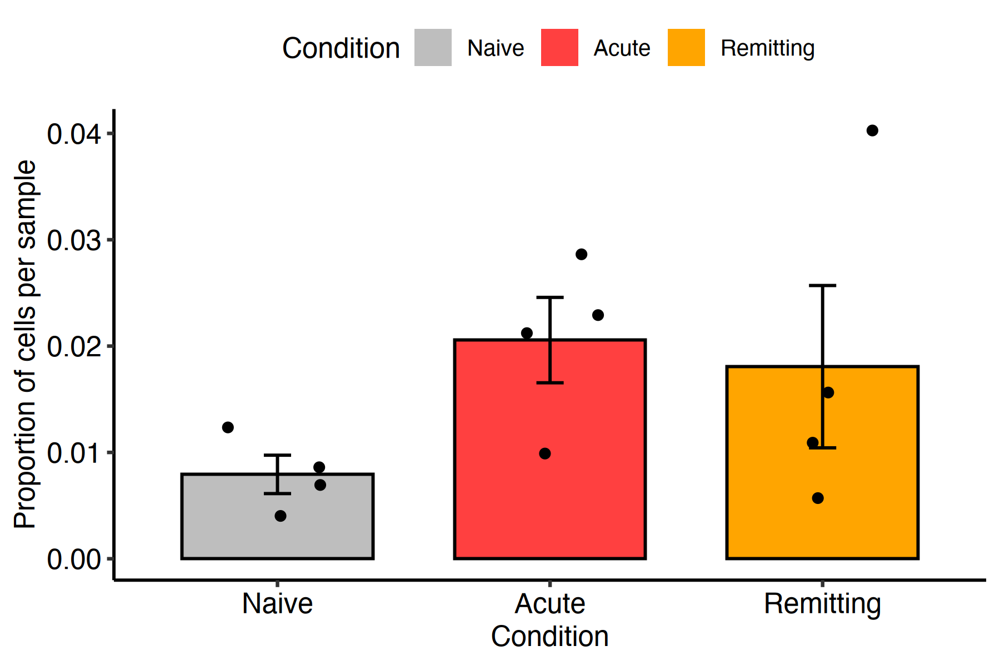

In [52]:
options(repr.plot.width=6, repr.plot.height=4, repr.plot.res = 300)

image = ggbarplot(counts_df, 
       x = 'condition', y = 'prop', color = 'condition', fill = 'condition', 
                 add=c('mean_se', 'jitter'), position = position_dodge(0.8)) + 
    labs(x = 'Condition', y = 'Proportion of cells per sample', fill = 'Condition') + 
    scale_color_manual(values = c('black', 'black', 'black')) + 
    scale_fill_manual(values = c('gray', 'brown1', 'orange')) + 
    scale_y_continuous(breaks=scales::pretty_breaks()) + 
    guides(color = 'none') + 
    theme_pubr()

ggsave(file="outputs/figures/wheeler_rebuttal_proportion_of_cells_per_sample.svg", plot=image, width=6, height=4, dpi = 600)

image

In summary:

1. The claim that the cells in the Wheeler dataset were "validated" as astrocytes based on [Extended Data Figure 3E](https://www.nature.com/articles/s41586-020-1999-0/figures/9) in Wheeler et al ([PMID: 32051591](https://pubmed.ncbi.nlm.nih.gov/32051591/)) is poorly founded. Examining astrocyte marker genes plotted over a t-SNE plot is not sufficient evidence that those cells are astrocytes. We can see clear expression of non-astrocyte cell type markers throughout cells in this dataset, which form the top marker genes of most clusters presented by Lee et al.
2. The claim that the epigenetic memory astrocyte phenotype survives non-astrocyte cell type removal and quality control filtering is untrue. 90% of the cells originally labeled as epigenetic memory astrocytes were removed by Lee et al themselves in their rebuttal. Only 4 cells from the original 1,878 cell cluster (0.2%) were also labeled as epigenetic memory astrocytes by Lee et al's rebuttal analysis.
3. The new epigenetic memory astrocyte cluster (Cluster 9) identified by Lee et al does not have significantly elevated up-signature and FIND-seq signature enrichment scores compared to other clusters.
4. Neither the new epigenetic memory astrocyte cluster (Cluster 9), nor any other cluster, appreciably expresses any genes from the corrected up-signature.
5. The authors' presentation of enrichment of the 'epigenetic memory signature' and FINDseq derived signature in dot plots obfuscates a lack of enrichment in Cluster 9, and the purported enrichment of the 'epigenetic memory signature' is driven entirely by slightly lower expression of down-signature genes. 
6. The new epigenetic memory astrocyte cluster (Cluster 9) appears to by comprised of ependymal cells based on marker gene expression, likely explaining the slightly lower expression of the astrocyte-enriched down-signature genes.
7. The new epigenetic memory astrocyte cluster has an average of only 12 cells per sample. These extremely small numbers are poor evidence for a robust astrocyte phenotype.

We conclude the authors' rebuttal to our claim that the epigenetic memory astrocyte phenotype identified in the Wheeler et al dataset is an artifact of non-astrocyte cell type contamination is unconvincing. These issues demonstrate that the epigenetic memory astrocyte phenotype is not robust and that Lee et al's methods for identifying putative epigenetic memory astrocytes in single cell RNA sequencing data are applied arbitrarily.

In [53]:
sessionInfo()

R version 4.3.3 (2024-02-29)
Platform: x86_64-apple-darwin13.4.0 (64-bit)
Running under: macOS Big Sur ... 10.16

Matrix products: default
BLAS/LAPACK: /Users/liddelowlab/mambaforge/envs/EpiMemAstros/lib/libopenblasp-r0.3.28.dylib;  LAPACK version 3.12.0

locale:
[1] en_US.UTF-8/en_US.UTF-8/en_US.UTF-8/C/en_US.UTF-8/en_US.UTF-8

time zone: America/New_York
tzcode source: system (macOS)

attached base packages:
[1] grid      stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] IRdisplay_1.1         svglite_2.1.3         ComplexHeatmap_2.18.0
 [4] gridExtra_2.3         cowplot_1.1.3         ggrastr_1.0.2        
 [7] ggrepel_0.9.6         presto_1.0.0          data.table_1.15.4    
[10] Rcpp_1.0.13-1         viridis_0.6.5         viridisLite_0.4.2    
[13] Nebulosa_1.12.0       patchwork_1.3.0       dplyr_1.1.4          
[16] ggsci_3.2.0           ggpubr_0.6.0          ggplot2_3.5.1        
[19] readxl_1.4.3          Seurat_5.1.0       

In [54]:
version

               _                           
platform       x86_64-apple-darwin13.4.0   
arch           x86_64                      
os             darwin13.4.0                
system         x86_64, darwin13.4.0        
status                                     
major          4                           
minor          3.3                         
year           2024                        
month          02                          
day            29                          
svn rev        86002                       
language       R                           
version.string R version 4.3.3 (2024-02-29)
nickname       Angel Food Cake             